## > Import modules

In [1]:
from distortionMaps import d2cMapping
import mrs_aux as maux
import funcs

import numpy as np
from itertools import product
import scipy.interpolate as scp_interpolate
from scipy.optimize import curve_fit
import scipy.special as sp
from scipy import signal
from astropy.io import fits
import matplotlib.pyplot as plt
%matplotlib notebook

import traceback
import warnings
warnings.simplefilter('ignore')


## > OTIS ASPA source MRS data

In [2]:
cdpDir   = '/Users/ioannisa/Desktop/python/miri_devel/cdp_data/'
data_path = '/Users/ioannisa/Desktop/python/miri_devel/OTIS_data/'

sci_imgs_v03 = {"1A":data_path +'MIRM32313-SS-V03-7249024654_1_495_SE_2017-09-06T02h54m21_LVL2.fits',
            "1B":data_path +'MIRM32313-MM-V03-7249025513_1_495_SE_2017-09-06T03h03m01_LVL2.fits', 
            "1C":data_path +'MIRM32313-LL-V03-7249030323_1_495_SE_2017-09-06T03h08m31_LVL2.fits', 
            "2A":data_path +'MIRM32313-SS-V03-7249024654_1_495_SE_2017-09-06T02h54m21_LVL2.fits', 
            "2B":data_path +'MIRM32313-MM-V03-7249025513_1_495_SE_2017-09-06T03h03m01_LVL2.fits', 
            "2C":data_path +'MIRM32313-LL-V03-7249030323_1_495_SE_2017-09-06T03h08m31_LVL2.fits', 
            "3A":data_path +'MIRM32313-SS-V03-7249024654_1_494_SE_2017-09-06T02h54m21_LVL2.fits', 
            "3B":data_path +'MIRM32313-MM-V03-7249025513_1_494_SE_2017-09-06T03h03m01_LVL2.fits', 
            "3C":data_path +'MIRM32313-LL-V03-7249030323_1_494_SE_2017-09-06T03h08m31_LVL2.fits', 
            "4A":data_path +'MIRM32313-SS-V03-7249024654_1_494_SE_2017-09-06T02h54m21_LVL2.fits', 
            "4B":data_path +'MIRM32313-MM-V03-7249025513_1_494_SE_2017-09-06T03h03m01_LVL2.fits', 
            "4C":data_path +'MIRM32313-LL-V03-7249030323_1_494_SE_2017-09-06T03h08m31_LVL2.fits'}

bkg_imgs_v03 = {"1A":data_path +'MIRM32313-SS-V03B-7249024337_1_495_SE_2017-09-06T02h49m41_LVL2.fits', 
            "1B":data_path +'MIRM32313-MM-V03B-7249025018_1_495_SE_2017-09-06T02h57m31_LVL2.fits', 
            "1C":data_path +'MIRM32313-LL-V03B-7249025837_1_495_SE_2017-09-06T03h05m21_LVL2.fits', 
            "2A":data_path +'MIRM32313-SS-V03B-7249024337_1_495_SE_2017-09-06T02h49m41_LVL2.fits', 
            "2B":data_path +'MIRM32313-MM-V03B-7249025018_1_495_SE_2017-09-06T02h57m31_LVL2.fits', 
            "2C":data_path +'MIRM32313-LL-V03B-7249025837_1_495_SE_2017-09-06T03h05m21_LVL2.fits', 
            "3A":data_path +'MIRM32313-SS-V03B-7249024337_1_494_SE_2017-09-06T02h49m41_LVL2.fits', 
            "3B":data_path +'MIRM32313-MM-V03B-7249025018_1_494_SE_2017-09-06T02h57m31_LVL2.fits', 
            "3C":data_path +'MIRM32313-LL-V03B-7249025837_1_494_SE_2017-09-06T03h05m21_LVL2.fits', 
            "4A":data_path +'MIRM32313-SS-V03B-7249024337_1_494_SE_2017-09-06T02h49m41_LVL2.fits', 
            "4B":data_path +'MIRM32313-MM-V03B-7249025018_1_494_SE_2017-09-06T02h57m31_LVL2.fits', 
            "4C":data_path +'MIRM32313-LL-V03B-7249025837_1_494_SE_2017-09-06T03h05m21_LVL2.fits'}

sci_imgs_v05 = {"1A":data_path +'MIRM32313-SS-V05-7249031538_1_495_SE_2017-09-06T03h23m41_LVL2.fits',
            "1B":data_path +'MIRM32313-MM-V05-7249032353_1_495_SE_2017-09-06T03h31m21_LVL2.fits', 
            "1C":data_path +'MIRM32313-LL-V05-7249033205_1_495_SE_2017-09-06T03h37m41_LVL2.fits', 
            "2A":data_path +'MIRM32313-SS-V05-7249031538_1_495_SE_2017-09-06T03h23m41_LVL2.fits', 
            "2B":data_path +'MIRM32313-MM-V05-7249032353_1_495_SE_2017-09-06T03h31m21_LVL2.fits', 
            "2C":data_path +'MIRM32313-LL-V05-7249033205_1_495_SE_2017-09-06T03h37m41_LVL2.fits', 
            "3A":data_path +'MIRM32313-SS-V05-7249031538_1_494_SE_2017-09-06T03h23m41_LVL2.fits', 
            "3B":data_path +'MIRM32313-MM-V05-7249032353_1_494_SE_2017-09-06T03h31m21_LVL2.fits', 
            "3C":data_path +'MIRM32313-LL-V05-7249033205_1_494_SE_2017-09-06T03h37m41_LVL2.fits', 
            "4A":data_path +'MIRM32313-SS-V05-7249031538_1_494_SE_2017-09-06T03h23m41_LVL2.fits', 
            "4B":data_path +'MIRM32313-MM-V05-7249032353_1_494_SE_2017-09-06T03h31m21_LVL2.fits', 
            "4C":data_path +'MIRM32313-LL-V05-7249033205_1_494_SE_2017-09-06T03h37m41_LVL2.fits'}

bkg_imgs_v05 = {"1A":data_path +'MIRM32313-SS-V05B-7249031039_1_495_SE_2017-09-06T03h18m01_LVL2.fits', 
            "1B":data_path +'MIRM32313-MM-V05B-7249031906_1_495_SE_2017-09-06T03h26m01_LVL2.fits', 
            "1C":data_path +'MIRM32313-LL-V05B-7249032716_1_495_SE_2017-09-06T03h34m51_LVL2.fits', 
            "2A":data_path +'MIRM32313-SS-V05B-7249031039_1_495_SE_2017-09-06T03h18m01_LVL2.fits', 
            "2B":data_path +'MIRM32313-MM-V05B-7249031906_1_495_SE_2017-09-06T03h26m01_LVL2.fits', 
            "2C":data_path +'MIRM32313-LL-V05B-7249032716_1_495_SE_2017-09-06T03h34m51_LVL2.fits', 
            "3A":data_path +'MIRM32313-SS-V05B-7249031039_1_494_SE_2017-09-06T03h18m01_LVL2.fits', 
            "3B":data_path +'MIRM32313-MM-V05B-7249031906_1_494_SE_2017-09-06T03h26m01_LVL2.fits', 
            "3C":data_path +'MIRM32313-LL-V05B-7249032716_1_494_SE_2017-09-06T03h34m51_LVL2.fits', 
            "4A":data_path +'MIRM32313-SS-V05B-7249031039_1_494_SE_2017-09-06T03h18m01_LVL2.fits', 
            "4B":data_path +'MIRM32313-MM-V05B-7249031906_1_494_SE_2017-09-06T03h26m01_LVL2.fits', 
            "4C":data_path +'MIRM32313-LL-V05B-7249032716_1_494_SE_2017-09-06T03h34m51_LVL2.fits'}

# Source position (cube alpha, beta, lambda)

In [3]:
band = '1A'
sci_file = sci_imgs_v03[band]
bkg_file = bkg_imgs_v03[band]


<IPython.core.display.Javascript object>


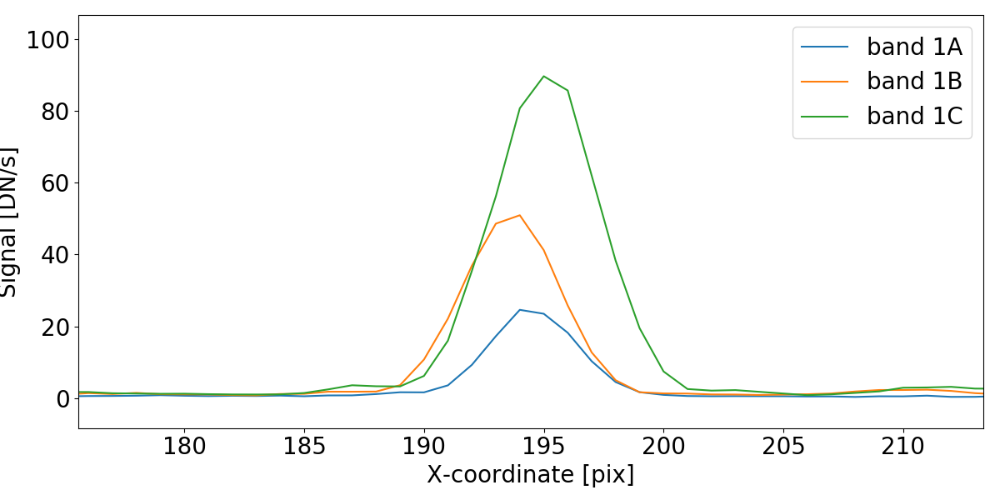

In [4]:
test1A = fits.open(sci_imgs_v03['1A'])[0].data[0,:,:]-fits.open(bkg_imgs_v03['1A'])[0].data[0,:,:]
test1B = fits.open(sci_imgs_v03['1B'])[0].data[0,:,:]-fits.open(bkg_imgs_v03['1B'])[0].data[0,:,:]
test1C = fits.open(sci_imgs_v03['1C'])[0].data[0,:,:]-fits.open(bkg_imgs_v03['1C'])[0].data[0,:,:]

plt.figure(figsize=(12,6))
plt.plot(test1A[512,:512],label='band 1A')
plt.plot(test1B[512,:512],label='band 1B')
plt.plot(test1C[512,:512],label='band 1C')
plt.xlim(0,512)
plt.ylim(0)
plt.legend(loc='upper right',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.xlabel('X-coordinate [pix]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.tight_layout()

# plt.figure(figsize=(12,6))
# plt.plot(d2cMapping('1A',cdpDir)['alphaMap'][512,:512],test1A[512,:512])
# plt.plot(d2cMapping('1B',cdpDir)['alphaMap'][512,:512],test1B[512,:512])
# # plt.xlim(0,512)
# plt.ylim(0)
# plt.tight_layout()

### > Import calibration files

In [5]:
fringe_file,photom_file,psf_file,resol_file = funcs.get_cdps(cdpDir=cdpDir,band=band)

fringe_img     = fits.open(fringe_file)[1].data        # [unitless]
photom_img     = fits.open(photom_file)[1].data        # [DN/s * pixel/mJy]
pixsiz_img     = fits.open(photom_file)[5].data        # [arcsec^2/pix]
psffits        = fits.open(psf_file)                   # [unitless]
specres_table  = fits.open(resol_file)[1].data         # [unitless]

### > Load distortion maps

In [6]:
# compute coordinate maps for spectral band
d2cMaps = d2cMapping(band,cdpDir)
# extract single maps
sliceMap  = d2cMaps['sliceMap']
alphaMap  = d2cMaps['alphaMap']
betaMap   = d2cMaps['betaMap']
lambdaMap = d2cMaps['lambdaMap']
nslices   = maux.MRS_nslices[band[0]]
mrs_fwhm  = maux.MRS_FWHM[band[0]]
bzero     = d2cMaps['bzero']
bdel      = d2cMaps['bdel']

# useful quantities
bandlims     = [lambdaMap[np.nonzero(lambdaMap)].min(),lambdaMap[np.nonzero(lambdaMap)].max()]
fov_lims     = [alphaMap[np.nonzero(lambdaMap)].min(),alphaMap[np.nonzero(lambdaMap)].max()]
unique_betas = np.sort(np.unique(betaMap[(sliceMap>100*int(band[0])) & (sliceMap<100*(int(band[0])+1))]))


### > Construct spectral grid through spectral binning

In [7]:
# define oversampling factor (integer larger equal to 1; factor of 1 equivalent to no oversampling)
oversampling = 1.

# Construct spectral (wavelength) grid
#> initialize variables
lambcens = []
lambfwhms = []

#> loop over wavelength bins (bin width defined based on MRS spectral resolution)
lamb0   = bandlims[0]
maxlamb = bandlims[1]

# first iteration
R       = funcs.getSpecR(lamb0=lamb0,band=band,specres_table=specres_table)
fwhm    = lamb0 / R
lambcen = lamb0 + (fwhm/2.)/oversampling

lambcens.append(lambcen)
lambfwhms.append(fwhm)

# iterate over spectral range
done = False
while not done:
    R = funcs.getSpecR(lamb0=lamb0,band=band,specres_table=specres_table)
    fwhm = lamb0 / R
    lambcen = lamb0 + (fwhm/2.)/oversampling
    if (lambcen > maxlamb-(fwhm/2.)/oversampling):
        done = True
    else:
        lamb0 = lambcen + (fwhm/2.)/oversampling

    lambcens.append(lambcen)
    lambfwhms.append(fwhm)


## Load observation

<IPython.core.display.Javascript object>


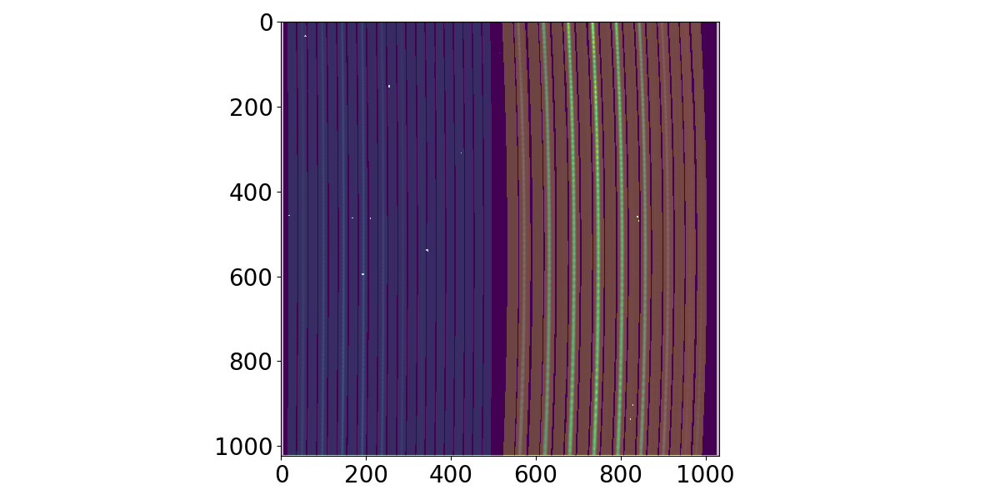

In [8]:
if not bkg_file:
    reduced_img = fits.open(sci_file)[0].data[0,:,:]
else:
    reduced_img = (fits.open(sci_file)[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:])

# plot detector image (slice map overplotted)
plt.figure(figsize=(12,6))
plt.imshow(reduced_img,vmin=0.,zorder=0)
plt.imshow(sliceMap,alpha=0.3,zorder=1)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()


<IPython.core.display.Javascript object>


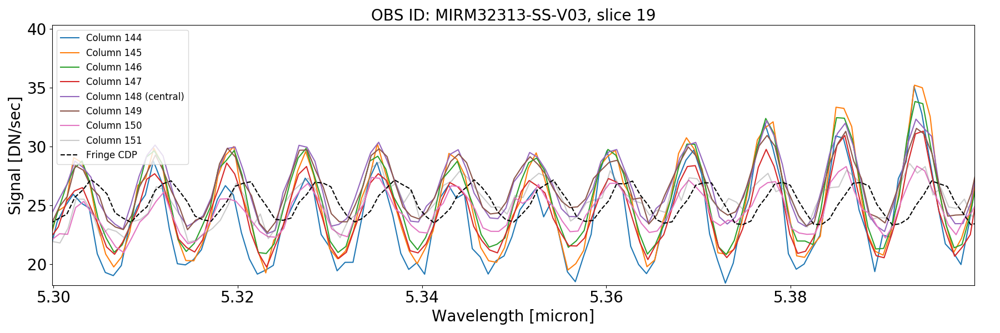

In [25]:
col = 148
plt.figure(figsize=(18,6))
plt.plot(lambdaMap[:,col-4],reduced_img[:,col-4]*6.5,label='Column {}'.format(col-4))
plt.plot(lambdaMap[:,col-3],reduced_img[:,col-3]*3,label='Column {}'.format(col-3))
plt.plot(lambdaMap[:,col-2],reduced_img[:,col-2]*1.5,label='Column {}'.format(col-2))
plt.plot(lambdaMap[:,col-1],reduced_img[:,col-1],label='Column {}'.format(col-1))
plt.plot(lambdaMap[:,col],reduced_img[:,col],label='Column {} (central)'.format(col))
plt.plot(lambdaMap[:,col+1],reduced_img[:,col+1]*1.3,label='Column {}'.format(col+1))
plt.plot(lambdaMap[:,col+2],reduced_img[:,col+2]*2,label='Column {}'.format(col+2))
plt.plot(lambdaMap[:,col+3],reduced_img[:,col+3]*5,alpha=0.4,label='Column {}'.format(col+3))
plt.plot(lambdaMap[:,col],fringe_img[:,col]*27,'k',linestyle='dashed',label='Fringe CDP')
# plt.xlim(400,600)
plt.xlim(5.3,5.4)
plt.ylim(12,38)
plt.ylabel('Signal [DN/sec]',fontsize=20)
# plt.xlabel('Detector y-coordinate [pix]',fontsize=20)
plt.xlabel('Wavelength [micron]',fontsize=20)
plt.title('OBS ID: MIRM32313-SS-V03, slice 19',fontsize=20)
plt.legend(loc='best',fontsize=12)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

# col = 194
# plt.figure(figsize=(12,6))
# plt.plot(reduced_img[:,col-2]*1.9,label='Column {}'.format(col-2))
# plt.plot(reduced_img[:,col-1],label='Column {}'.format(col-1))
# plt.plot(reduced_img[:,col]/1.5,label='Column {} (central)'.format(col))
# plt.plot(reduced_img[:,col+1]/1.3,label='Column {}'.format(col+1))
# plt.plot(reduced_img[:,col+2],label='Column {}'.format(col+2))
# plt.plot(fringe_img[:,col]*18,'k',linestyle='dashed',label='Fringe CDP')
# plt.xlim(400,600)
# plt.ylim(12,30)
# plt.ylabel('Signal [DN/sec]',fontsize=20)
# plt.xlabel('Detector y-coordinate [pix]',fontsize=20)
# plt.title('OBS ID: MIRM32313-SS-V03, slice 18',fontsize=20)
# plt.legend(loc='best',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

# col = 100
# plt.figure(figsize=(12,6))
# plt.plot(reduced_img[:,col-2]*1.7,label='Column {}'.format(col-2))
# plt.plot(reduced_img[:,col-1],label='Column {}'.format(col-1))
# plt.plot(reduced_img[:,col]/1.5,label='Column {} (central)'.format(col))
# plt.plot(reduced_img[:,col+1]/1.3,label='Column {}'.format(col+1))
# plt.plot(reduced_img[:,col+2],label='Column {}'.format(col+2))
# plt.plot(fringe_img[:,col]*16,'k',linestyle='dashed',label='Fringe CDP')
# plt.xlim(400,600)
# plt.ylim(10,22)
# plt.ylabel('Signal [DN/sec]',fontsize=20)
# plt.xlabel('Detector y-coordinate [pix]',fontsize=20)
# plt.title('OBS ID: MIRM32313-SS-V03, slice 20',fontsize=20)
# plt.legend(loc='best',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

# plt.figure(figsize=(18,6))
# plt.plot(lambdaMap[:,col-4],reduced_img[:,col-4]*8,label='Column {}'.format(col-4))
# plt.plot(lambdaMap[:,col-3],reduced_img[:,col-3]*4,label='Column {}'.format(col-3))
# plt.plot(lambdaMap[:,col-2],reduced_img[:,col-2]*1.7,label='Column {}'.format(col-2))
# plt.plot(lambdaMap[:,col-1],reduced_img[:,col-1],label='Column {}'.format(col-1))
# plt.plot(lambdaMap[:,col],reduced_img[:,col]/1.5,label='Column {} (central)'.format(col))
# plt.plot(lambdaMap[:,col+1],reduced_img[:,col+1]/1.3,label='Column {}'.format(col+1))
# plt.plot(lambdaMap[:,col+2],reduced_img[:,col+2],label='Column {}'.format(col+2))
# plt.plot(lambdaMap[:,col+3],reduced_img[:,col+3]*2,alpha=0.4,label='Column {}'.format(col+3))
# plt.plot(lambdaMap[:,col],fringe_img[:,col]*16,'k',linestyle='dashed',label='Fringe CDP')
# # plt.xlim(400,600)
# plt.xlim(5.3,5.4)
# plt.ylim(10,22)
# plt.ylabel('Signal [DN/sec]',fontsize=20)
# # plt.xlabel('Detector y-coordinate [pix]',fontsize=20)
# plt.xlabel('Wavelength [micron]',fontsize=20)
# plt.title('OBS ID: MIRM32313-SS-V03, slice 20',fontsize=20)
# plt.legend(loc='best',fontsize=14)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

In [9]:
# premise> center of point source is located in slice with largest signal
# across-slice center:
sum_signals = np.zeros(nslices)
for islice in xrange(1+nslices):
    sum_signals[islice-1] = reduced_img[(sliceMap == 100*int(band[0])+islice) & (~np.isnan(reduced_img))].sum()
source_center_slice = np.argmax(sum_signals)+1

print 'Slice {} has the largest summed flux'.format(source_center_slice)

# along-slice center:
img = np.full((1024,1032),0.)
sel = (sliceMap == 100*int(band[0])+source_center_slice)
img[sel]  = reduced_img[sel]

first_nonzero_row = 0
while all(img[first_nonzero_row,:][~np.isnan(img[first_nonzero_row,:])] == 0.): first_nonzero_row+=1
source_center_alpha = alphaMap[first_nonzero_row,img[first_nonzero_row,:].argmax()]

if band in ['4A','4B']:
    source_center_alpha = 0

# summary:
print 'Rough source position: beta = {}arcsec, alpha = {}arcsec'.format(round(unique_betas[source_center_slice-1],2),round(source_center_alpha,2))


Slice 19 has the largest summed flux
Rough source position: beta = 1.42arcsec, alpha = -0.01arcsec


In [12]:
# Fit Gaussian distribution to along-slice signal profile
sign_amp,alpha_centers,alpha_fwhms = [np.full((len(lambcens)),np.nan) for j in range(3)]
failed_fits = []
for ibin in xrange(len(lambcens)):
    coords = np.where((sliceMap == 100*int(band[0])+source_center_slice) & (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img)))
    if len(coords[0]) == 0: failed_fits.append(ibin); continue
    try:popt,pcov = curve_fit(funcs.gauss1d_wBaseline, alphaMap[coords], reduced_img[coords], p0=[reduced_img[coords].max(),source_center_alpha,mrs_fwhm/2.355,0],method='lm')
    except: failed_fits.append(ibin); continue
    sign_amp[ibin]      = popt[0]+popt[3]
    alpha_centers[ibin] = popt[1]
    alpha_fwhms[ibin]   = 2.355*np.abs(popt[2])

# omit outliers
for i in xrange(len(np.diff(sign_amp))):
    if np.abs(np.diff(alpha_centers)[i]) > 0.05:
        sign_amp[i],sign_amp[i+1],alpha_centers[i],alpha_centers[i+1],alpha_fwhms[i],alpha_fwhms[i+1] = [np.nan for j in range(6)]

print '[Along-slice fit] The following bins failed to converge:'
print failed_fits

# Fit Gaussian distribution to across-slice signal profile (signal brute-summed in each slice)
summed_signal,beta_centers,beta_fwhms = [np.full((len(lambcens)),np.nan) for j in range(3)]
failed_fits = []
for ibin in range(len(lambcens)):
    if np.isnan(alpha_centers[ibin]): failed_fits.append(ibin);continue
    sel = (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img))
    try:signals = np.array([reduced_img[(sliceMap == 100*int(band[0])+islice) & sel][np.abs(alphaMap[(sliceMap == 100*int(band[0])+islice) & sel]-alpha_centers[ibin]).argmin()] for islice in range(1,1+nslices)])
    except ValueError: failed_fits.append(ibin); continue
    try:popt,pcov = curve_fit(funcs.gauss1d_wBaseline, unique_betas, signals, p0=[signals.max(),unique_betas[source_center_slice-1],mrs_fwhm/2.355,0],method='lm')
    except: failed_fits.append(ibin); continue
    summed_signal[ibin] = popt[0]+popt[3]
    beta_centers[ibin]  = popt[1]
    beta_fwhms[ibin]    = 2.355*np.abs(popt[2])

# # omit outliers
# for i in range(len(np.diff(summed_signal))):
#     if np.abs(np.diff(beta_centers)[i]) > 0.05:
#         summed_signal[i],summed_signal[i+1],beta_centers[i],beta_centers[i+1],beta_fwhms[i],beta_fwhms[i+1] = [np.nan for j in range(6)]

print '[Across-slice fit] The following bins failed to converge:'
print failed_fits

[Along-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598]
[Across-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598]


<IPython.core.display.Javascript object>


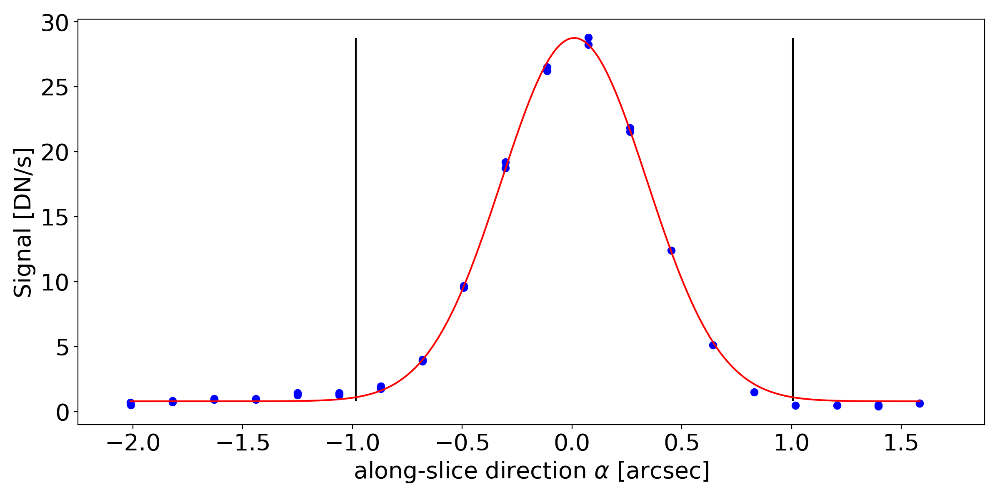

<IPython.core.display.Javascript object>


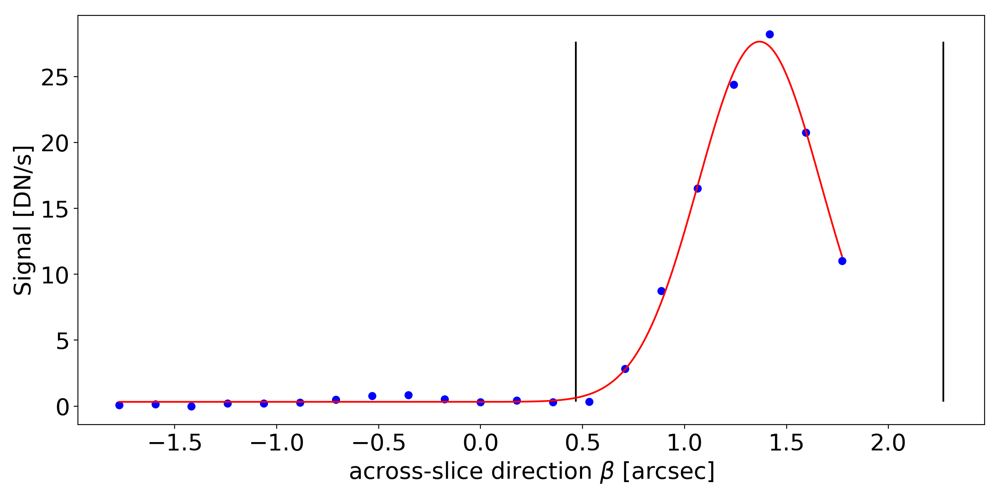

In [14]:
# Plot centroiding results (with 3sigma vertical lines)
ibin = len(lambcens)/2
# along-slice source centroiding
coords = np.where((sliceMap == 100*int(band[0])+source_center_slice) & (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img)))
popt,pcov = curve_fit(funcs.gauss1d_wBaseline, alphaMap[coords], reduced_img[coords], p0=[reduced_img[coords].max(),0,mrs_fwhm/2.355,0.],method='lm')
testx = np.linspace(alphaMap[coords].min(),alphaMap[coords].max(),1000)
testy = funcs.gauss1d_wBaseline(testx,*popt)
plt.figure(figsize=(12,6))
plt.plot(alphaMap[coords], reduced_img[coords],'bo')
plt.plot(testx, testy,'r')
plt.vlines([alpha_centers[ibin]-3*alpha_fwhms[ibin].max()/2.355,alpha_centers[ibin]+3*alpha_fwhms[ibin].max()/2.355],testy.min(),testy.max())
plt.xlim(fov_lims[0],fov_lims[1])
plt.tick_params(axis='both',labelsize=20)
plt.xlabel(r'along-slice direction $\alpha$ [arcsec]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.tight_layout()

# across-slice source centroiding
sel = (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img))
signals = np.zeros(nslices)
for islice in range(1,1+nslices):
    signals[islice-1] = reduced_img[(sliceMap == 100*int(band[0])+islice) & sel][np.abs(alphaMap[(sliceMap == 100*int(band[0])+islice) & sel]-popt[1]).argmin()]
popt,pcov = curve_fit(funcs.gauss1d_wBaseline, unique_betas, signals, p0=[signals.max(),beta_centers[ibin],mrs_fwhm/2.355,0],method='lm')
testx = np.linspace(unique_betas.min(),unique_betas.max(),1000)
testy = funcs.gauss1d_wBaseline(testx,*popt)
plt.figure(figsize=(12,6))
plt.plot(unique_betas, signals,'bo')
plt.plot(testx, testy,'r')
plt.vlines([beta_centers[ibin]-3*beta_fwhms[ibin].max()/2.355,beta_centers[ibin]+3*beta_fwhms[ibin].max()/2.355],testy.min(),testy.max())
plt.tick_params(axis='both',labelsize=20)
plt.xlabel(r'across-slice direction $\beta$ [arcsec]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.tight_layout()

Source center [middle bin]: alpha = 0.01arcsec, beta = 1.36arcsec


<IPython.core.display.Javascript object>


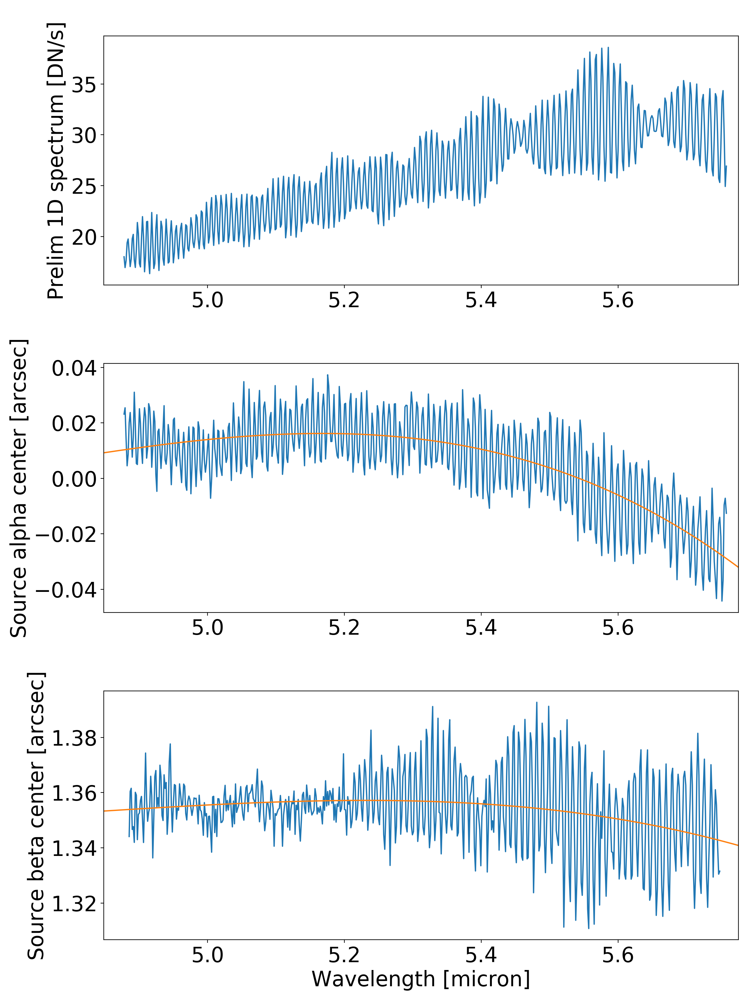

In [16]:
# fit 4th order polynomial to derived along-slice source centers (one for each spectral bin)
popt_alpha,pcov_alpha = curve_fit(funcs.order3polyfit, np.array(lambcens)[~np.isnan(alpha_centers)], alpha_centers[~np.isnan(alpha_centers)],method='lm')
popt_beta,pcov_beta = curve_fit(funcs.order3polyfit, np.array(lambcens)[~np.isnan(beta_centers)], beta_centers[~np.isnan(beta_centers)],method='lm')

source_center_alpha = funcs.order3polyfit(lambcens[len(lambcens)/2],*popt_alpha) # [arcsec]
source_center_beta  = funcs.order3polyfit(lambcens[len(lambcens)/2],*popt_beta)  # [arcsec]
print 'Source center [middle bin]: alpha = {}arcsec, beta = {}arcsec'.format(round(source_center_alpha,2),round(source_center_beta,2))

wavl_range = np.linspace(np.array(lambcens).min(),np.array(lambcens).max(),1000)
source_center_alphas = funcs.order3polyfit(wavl_range,*popt_alpha)
source_center_betas  = funcs.order3polyfit(wavl_range,*popt_beta)

# plot
fig,axs = plt.subplots(3,1,figsize=(12,16))
axs[0].plot(np.array(lambcens)[~np.isnan(sign_amp)],sign_amp[~np.isnan(sign_amp)])
axs[0].set_xlim(lambcens[0],lambcens[-1])
axs[0].set_ylabel('Prelim 1D spectrum [DN/s]',fontsize=24)
axs[0].tick_params(axis='both',labelsize=24)
axs[1].plot(np.array(lambcens)[~np.isnan(alpha_centers)],alpha_centers[~np.isnan(alpha_centers)] )
axs[1].plot(wavl_range,source_center_alphas)
axs[1].set_xlim(lambcens[0],lambcens[-1])
axs[1].set_ylabel('Source alpha center [arcsec]',fontsize=24)
axs[1].tick_params(axis='both',labelsize=24)
axs[2].plot(lambcens,beta_centers)
axs[2].plot(wavl_range,source_center_betas,label='4th order polynomial fit')
axs[2].set_xlim(lambcens[0],lambcens[-1])
# axs[2].set_ylim(np.mean(beta_centers[~np.isnan(beta_centers)])-0.2,np.mean(beta_centers[~np.isnan(beta_centers)])+0.2)
axs[2].set_xlabel('Wavelength [micron]',fontsize=24)
axs[2].set_ylabel('Source beta center [arcsec]',fontsize=24)
axs[2].tick_params(axis='both',labelsize=24)
plt.tight_layout()


<IPython.core.display.Javascript object>


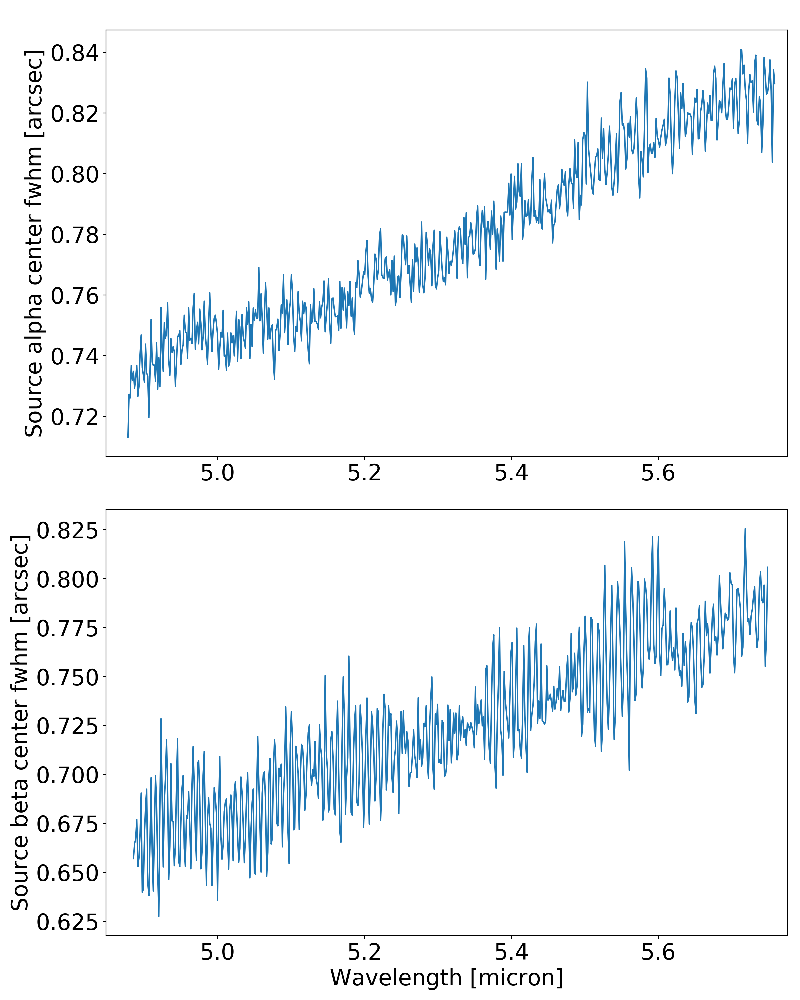

In [17]:
# plot FWHM on fitted source centers
fig,axs = plt.subplots(2,1,figsize=(12,15))

# along-slice direction
axs[0].plot(np.array(lambcens)[~np.isnan(alpha_fwhms)],alpha_fwhms[~np.isnan(alpha_fwhms)])
axs[0].set_xlim(lambcens[0],lambcens[-1])
axs[0].set_ylabel('Source alpha center fwhm [arcsec]',fontsize=24)
axs[0].tick_params(axis='both',labelsize=24)
# across-slice direction
axs[1].plot(lambcens,beta_fwhms)
axs[1].set_xlim(lambcens[0],lambcens[-1])
axs[1].set_xlabel('Wavelength [micron]',fontsize=24)
axs[1].set_ylabel('Source beta center fwhm [arcsec]',fontsize=24)
axs[1].tick_params(axis='both',labelsize=24)

plt.tight_layout()


### >> Iterate on the centroiding by fitting source position with 2d Gaussian/Voight distribution

Original parameter guess :            Result fitting parameters: 
--------------------------            -------------------------- 
amp    = 20.8855 DN/s                 amp    = 21.3443 DN/s 
alpha0 = 0.0022 arcsec                alpha0 = 0.0018 arcsec   
beta0  = 1.3516 arcsec                beta0  = 1.354 arcsec   
sigma_alpha = 0.3199 arcsec           sigma_alpha = 0.3261 arcsec 
sigma_beta  = 0.2924 arcsec           sigma_beta = 0.295 arcsec  
base = 0.0 DN/s                       base = 0.3249 DN/s


<IPython.core.display.Javascript object>


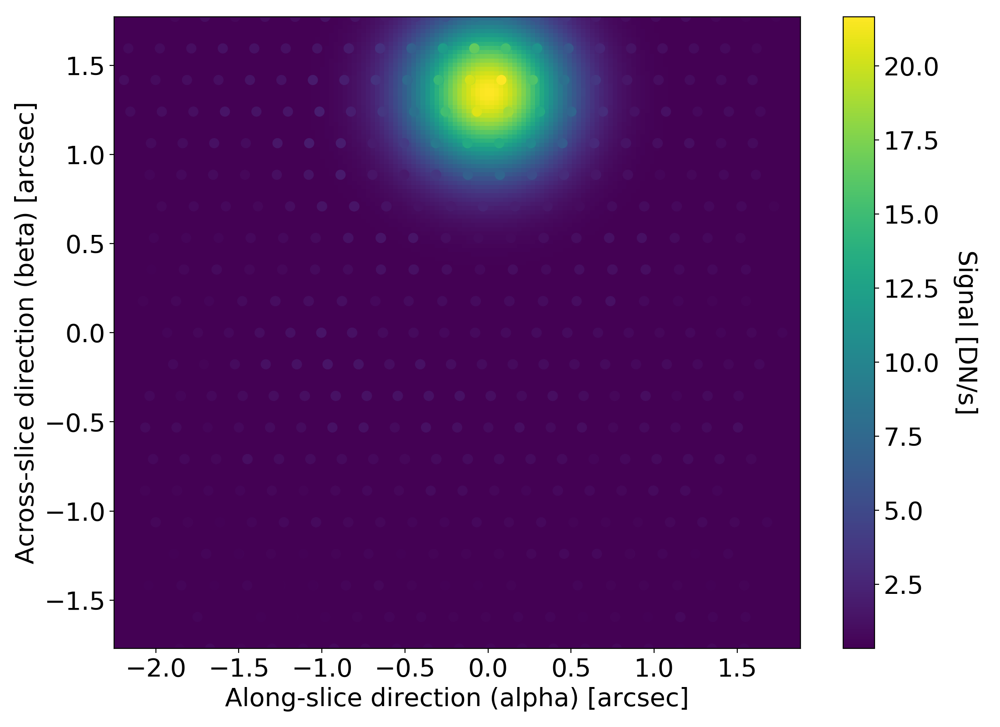

In [18]:
ibin       = 100

# initial guess for fitting, informed by previous centroiding steps
amp,alpha0,beta0  = sign_amp[ibin],alpha_centers[ibin],beta_centers[ibin]
sigma_alpha, sigma_beta    = alpha_fwhms[ibin]/2.355, beta_fwhms[ibin]/2.355
base = 0.
guess = [amp, alpha0, beta0, sigma_alpha, sigma_beta, base]
bounds = ([0,-np.inf,-np.inf,0,0,-np.inf],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf])

# data to fit
coords = (np.abs(lambdaMap-lambcens[ibin])<lambfwhms[ibin]/2.)
alphas, betas, zobs   = alphaMap[coords],betaMap[coords],reduced_img[coords]
alphabetas = np.array([alphas,betas])

# projected grid
betai, alphai = np.mgrid[unique_betas.min():unique_betas.max():150j, fov_lims[0]:fov_lims[1]:150j]
alphabetai = np.vstack([alphai.ravel(), betai.ravel()])

# perform fitting
popt,pcov = curve_fit(funcs.gauss2d, alphabetas, zobs, p0=guess,bounds=bounds)

zmodel = funcs.gauss2d(alphabetai, *guess)
zmodel.shape = alphai.shape
zpred = funcs.gauss2d(alphabetai, *popt)
zpred.shape = alphai.shape

print '\
Original parameter guess :            Result fitting parameters: \n\
--------------------------            -------------------------- \n\
amp    = {} DN/s                 amp    = {} DN/s \n\
alpha0 = {} arcsec                alpha0 = {} arcsec   \n\
beta0  = {} arcsec                beta0  = {} arcsec   \n\
sigma_alpha = {} arcsec           sigma_alpha = {} arcsec \n\
sigma_beta  = {} arcsec           sigma_beta = {} arcsec  \n\
base = {} DN/s                       base = {} DN/s'.format(round(guess[0],4),round(popt[0],4),round(guess[1],4),round(popt[1],4),round(guess[2],4),round(popt[2],4),round(guess[3],4),round(popt[3],4),round(guess[4],4),round(popt[4],4),round(guess[5],4),round(popt[5],4))

# plot result
fig, ax = plt.subplots(figsize=(11,8))
ax.scatter(alphas, betas, c=zobs, s=50)
im = ax.imshow(zpred, extent=[alphai.min(), alphai.max(), betai.max(), betai.min()],
               aspect='auto')
cbar = fig.colorbar(im)
cbar.ax.tick_params(labelsize=20)
cbar.set_label(r'Signal [DN/s]', labelpad=30,rotation=270,fontsize=20)
plt.xlabel(r'Along-slice direction (alpha) [arcsec]',fontsize=20)
plt.ylabel(r'Across-slice direction (beta) [arcsec]',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
ax.invert_yaxis()
plt.tight_layout()

<IPython.core.display.Javascript object>


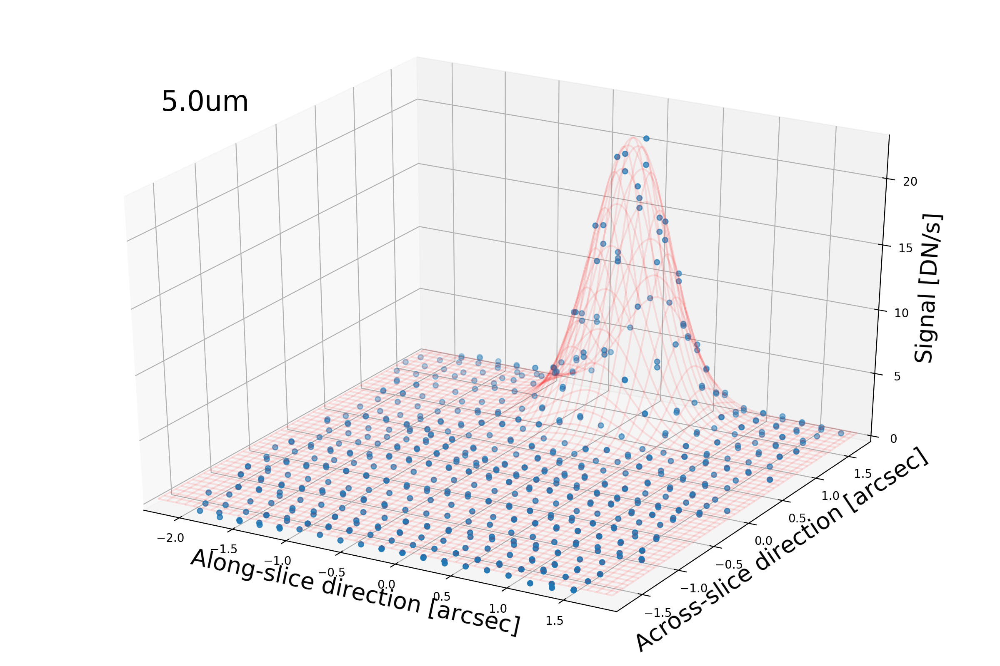

In [19]:
# make wireframe plot
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12,8))
ax = fig.gca(projection='3d')
ax.scatter(alphas, betas, zobs)
ax.plot_wireframe(alphai,betai, zpred,color='r',alpha=0.1)
ax.set_xlim(fov_lims[0],fov_lims[1])
ax.set_ylim(unique_betas.min(),unique_betas.max())
ax.set_zlim(0)
ax.set_xlabel('Along-slice direction [arcsec]',fontsize=20)
ax.set_ylabel('Across-slice direction [arcsec]',fontsize=20)
ax.set_zlabel('Signal [DN/s]',fontsize=20)
ax.text2D(0.15, 0.85, str(round(lambcens[ibin],2))+'um', transform=ax.transAxes,fontsize=24)
ax.tick_params(axis='both',labelsize=10)
plt.tight_layout()


<IPython.core.display.Javascript object>


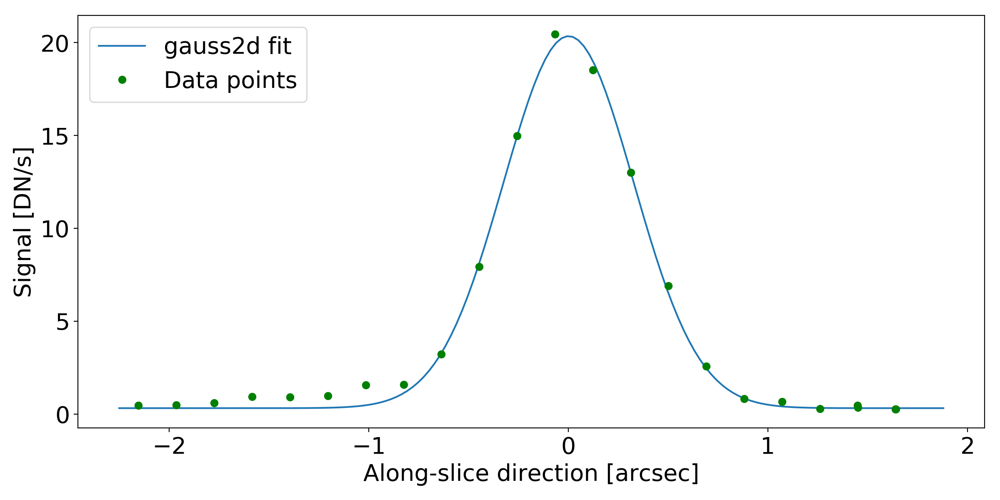

In [22]:
# check 1d fit conformity
#> from 2d fitting, plot in along-slice direction, choose a slice
beta_pos = unique_betas[funcs.find_nearest(unique_betas,1.3)]
coords = np.where((np.abs(lambdaMap-lambcens[ibin])<lambfwhms[ibin]/2.) & (betaMap == beta_pos))
closest_betai_idx = np.abs(np.unique(betai)-beta_pos).argmin()

plt.figure(figsize=(12,6))
plt.plot(alphai[closest_betai_idx], zpred[closest_betai_idx],label='gauss2d fit')
plt.plot(alphaMap[coords],reduced_img[coords],'go',label='Data points')
plt.xlabel('Along-slice direction [arcsec]',fontsize=20)
plt.ylabel('Signal [DN/s]',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.legend(loc='upper left',fontsize=20)
plt.tight_layout()


In [23]:
sign_amp2D,alpha_centers2D,beta_centers2D,sigma_alpha2D,sigma_beta2D = [np.full((len(lambcens)),np.nan) for j in range(5)]
failed_fits = []

for ibin in range(len(lambcens)):
    # initial guess for fitting, informed by previous centroiding steps
    amp,alpha0,beta0  = sign_amp[ibin],alpha_centers[ibin],beta_centers[ibin]
    sigma_alpha, sigma_beta    = alpha_fwhms[ibin]/2.355, beta_fwhms[ibin]/2.355
    base = 0
    guess = [amp, alpha0, beta0, sigma_alpha, sigma_beta, base]
    bounds = ([0,-np.inf,-np.inf,0,0,-np.inf],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf])

    # data to fit
    coords = (np.abs(lambdaMap-lambcens[ibin])<lambfwhms[ibin]/2.)
    alphas, betas, zobs   = alphaMap[coords],betaMap[coords],reduced_img[coords]
    alphabetas = np.array([alphas,betas])

    # perform fitting
    try:popt,pcov = curve_fit(funcs.gauss2d, alphabetas, zobs, p0=guess,bounds=bounds)
    except: failed_fits.append(ibin); continue

    sign_amp2D[ibin]      = popt[0]
    alpha_centers2D[ibin] = popt[1]
    beta_centers2D[ibin]  = popt[2]
    sigma_alpha2D[ibin]   = popt[3]
    sigma_beta2D[ibin]    = popt[4]


print 'The following bins failed to converge:'
print failed_fits

The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 39, 40, 41, 43, 121, 122, 123, 197, 203, 295, 296, 304, 305, 306, 345, 346, 347, 348, 371, 372, 373, 374, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598]


Source 1D center [middle bin]: alpha1D = 0.01arcsec, beta1D = 1.36arcsec
Source 2D center [middle bin]: alpha2D = 0.01arcsec, beta2D = 1.36arcsec


<IPython.core.display.Javascript object>


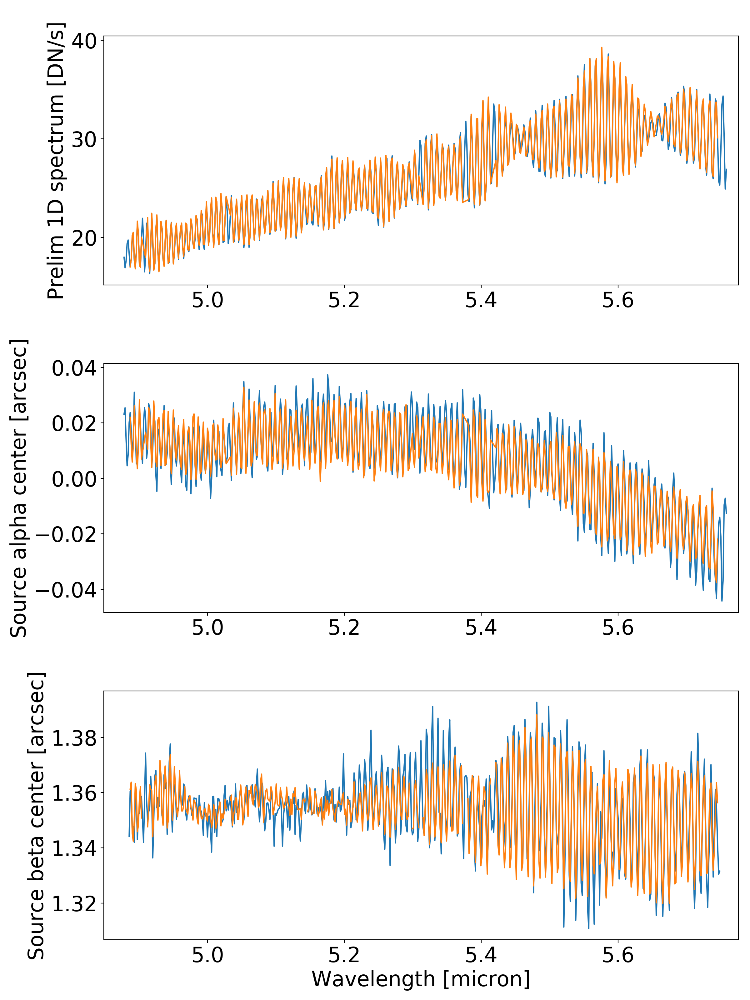

In [24]:
# fit 4th order polynomial to derived along-slice source centers (one for each spectral bin)
popt_alpha2D,pcov_alpha2D = curve_fit(funcs.order4polyfit, np.array(lambcens)[~np.isnan(alpha_centers2D)], alpha_centers2D[~np.isnan(alpha_centers2D)],method='lm')
popt_beta2D,pcov_beta2D = curve_fit(funcs.order4polyfit, np.array(lambcens)[~np.isnan(beta_centers2D)], beta_centers2D[~np.isnan(beta_centers2D)],method='lm')

source_center_alpha2D = funcs.order4polyfit(lambcens[len(lambcens)/2],*popt_alpha2D) # [arcsec]
source_center_beta2D  = funcs.order4polyfit(lambcens[len(lambcens)/2],*popt_beta2D)  # [arcsec]
print 'Source 1D center [middle bin]: alpha1D = {}arcsec, beta1D = {}arcsec'.format(round(source_center_alpha,2),round(source_center_beta,2))
print 'Source 2D center [middle bin]: alpha2D = {}arcsec, beta2D = {}arcsec'.format(round(source_center_alpha2D,2),round(source_center_beta2D,2))

wavl_range = np.linspace(np.array(lambcens).min(),np.array(lambcens).max(),1000)
source_center_alphas = funcs.order4polyfit(wavl_range,*popt_alpha2D)
source_center_betas  = funcs.order4polyfit(wavl_range,*popt_beta2D)

# plot
fig,axs = plt.subplots(3,1,figsize=(12,16))
axs[0].plot(np.array(lambcens)[~np.isnan(sign_amp)],sign_amp[~np.isnan(sign_amp)])
axs[0].plot(np.array(lambcens)[~np.isnan(sign_amp2D)],sign_amp2D[~np.isnan(sign_amp2D)])
axs[0].set_xlim(lambcens[0],lambcens[-1])
axs[0].set_ylabel('Prelim 1D spectrum [DN/s]',fontsize=24)
axs[0].tick_params(axis='both',labelsize=24)
axs[1].plot(np.array(lambcens)[~np.isnan(alpha_centers)],alpha_centers[~np.isnan(alpha_centers)] )
axs[1].plot(np.array(lambcens)[~np.isnan(alpha_centers2D)],alpha_centers2D[~np.isnan(alpha_centers2D)] )
# axs[1].plot(wavl_range,source_center_alphas,label='4th order polynomial fit')
axs[1].set_xlim(lambcens[0],lambcens[-1])
axs[1].set_ylabel('Source alpha center [arcsec]',fontsize=24)
axs[1].legend(loc='lower left',fontsize=14)
axs[1].tick_params(axis='both',labelsize=24)
axs[2].plot(lambcens,beta_centers)
axs[2].plot(lambcens,beta_centers2D)
# axs[2].plot(wavl_range,source_center_betas,label='4th order polynomial fit')
axs[2].set_xlim(lambcens[0],lambcens[-1])
axs[2].set_xlabel('Wavelength [micron]',fontsize=24)
axs[2].set_ylabel('Source beta center [arcsec]',fontsize=24)
axs[2].legend(loc='lower left',fontsize=14)
axs[2].tick_params(axis='both',labelsize=24)
plt.tight_layout()


# Stitch MRS spectra of all spectral bands

In [15]:
# LOAD PREVIOUSLY SAVED 1D SPECTRA (DICTIONARY W/ ALL BANDS)
band_signal = funcs.load_obj('OTIS_1dspectrum_dict') # Jy/arcsec2
band_wavelength = funcs.load_obj('OTIS_1dspectrum_wvl_dict') # micron

band_signal = funcs.load_obj('OTIS_1dspectrum_dict_DNsec') # DN/sec
band_wavelength = funcs.load_obj('OTIS_1dspectrum_wvl_dict_DNsec') # micron

<IPython.core.display.Javascript object>


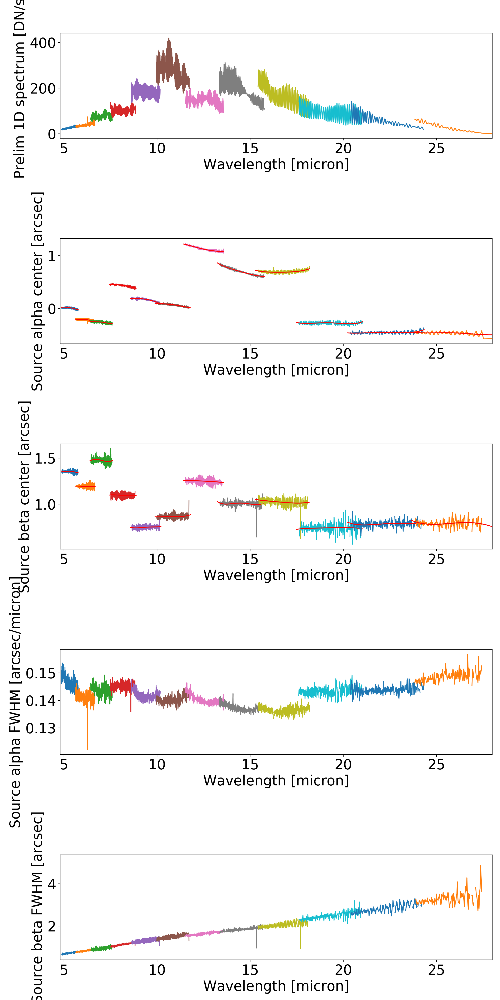

Band 1A
Slice 19 has the largest summed flux
Rough source position: beta = 1.42arcsec, alpha = -0.01arcsec
[Along-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598]
[Across-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 582, 583, 584, 585, 586, 587, 588, 589, 590, 591, 592, 593, 594, 595, 596, 597, 598]
Source center [middle bin]: alpha = 0.02arcsec, beta = 1.36arcsec 

Band 1B
Slice 18 has the largest summed flux
Rough source position: beta = 1.24arcsec, alpha = -0.2arcsec
[Along-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 575, 576, 577, 578, 579, 580, 581, 582]
[Across-slice fit] The following bins failed to converge:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 2

In [78]:
fig1,axs1 = plt.subplots(5,1,figsize=(12,24))

band_wavelength,band_signal = {},{}
band_alpha,band_beta = {},{}
band_alpha_fwhm,band_beta_fwhm = {},{}
for band in ['1A','1B','1C','2A','2B','2C','3A','3B','3C','4A','4B','4C']:
    print 'Band {}'.format(band)
    # observation
    sci_file = sci_imgs_v03[band]
    bkg_file = bkg_imgs_v03[band]
    
    # cpd files
    fringe_file,photom_file,psf_file,resol_file = funcs.get_cdps(cdpDir=cdpDir,band=band)

    fringe_img     = fits.open(fringe_file)[1].data        # [unitless]
    photom_img     = fits.open(photom_file)[1].data        # [DN/s * pixel/mJy]
    pixsiz_img     = fits.open(photom_file)[5].data        # [arcsec^2/pix]
    psffits        = fits.open(psf_file)                   # [unitless]
    specres_table  = fits.open(resol_file)[1].data         # [unitless]
    
    # compute coordinate maps for spectral band
    d2cMaps = d2cMapping(band,cdpDir)
    # extract single maps
    sliceMap  = d2cMaps['sliceMap']
    alphaMap  = d2cMaps['alphaMap']
    betaMap   = d2cMaps['betaMap']
    lambdaMap = d2cMaps['lambdaMap']
    nslices   = maux.MRS_nslices[band[0]]
    mrs_fwhm  = maux.MRS_FWHM[band[0]]
    bzero     = d2cMaps['bzero']
    bdel      = d2cMaps['bdel']

    # useful quantities
    bandlims     = [lambdaMap[np.nonzero(lambdaMap)].min(),lambdaMap[np.nonzero(lambdaMap)].max()]
    fov_lims     = [alphaMap[np.nonzero(lambdaMap)].min(),alphaMap[np.nonzero(lambdaMap)].max()]
    unique_betas = np.sort(np.unique(betaMap[(sliceMap>100*int(band[0])) & (sliceMap<100*(int(band[0])+1))]))

    # construct spectral grid
    # define oversampling factor (integer larger equal to 1; factor of 1 equivalent to no oversampling)
    oversampling = 1.

    # Construct spectral (wavelength) grid
    #> initialize variables
    lambcens = []
    lambfwhms = []

    #> loop over wavelength bins (bin width defined based on MRS spectral resolution)
    lamb0   = bandlims[0]
    maxlamb = bandlims[1]

    # first iteration
    R       = funcs.getSpecR(lamb0=lamb0,band=band,specres_table=specres_table)
    fwhm    = lamb0 / R
    lambcen = lamb0 + (fwhm/2.)/oversampling

    lambcens.append(lambcen)
    lambfwhms.append(fwhm)

    # iterate over spectral range
    done = False
    while not done:
        R = funcs.getSpecR(lamb0=lamb0,band=band,specres_table=specres_table)
        fwhm = lamb0 / R
        lambcen = lamb0 + (fwhm/2.)/oversampling
        if (lambcen > maxlamb-(fwhm/2.)/oversampling):
            done = True
        else:
            lamb0 = lambcen + (fwhm/2.)/oversampling

        lambcens.append(lambcen)
        lambfwhms.append(fwhm)

    # reduced slope image
    if not bkg_file:
        reduced_img = fits.open(sci_file)[0].data[0,:,:] #/photom_img/pixsiz_img
    else:
        reduced_img = (fits.open(sci_file)[0].data[0,:,:]-fits.open(bkg_file)[0].data[0,:,:]) #/photom_img/pixsiz_img
        
    # determine rough centroid
    # across-slice center:
    sum_signals = np.zeros(nslices)
    for islice in xrange(1+nslices):
        sum_signals[islice-1] = reduced_img[(sliceMap == 100*int(band[0])+islice) & (~np.isnan(reduced_img))].sum()
        
    source_center_slice = np.argmax(sum_signals)+1

    print 'Slice {} has the largest summed flux'.format(source_center_slice)
    
    # Use only one slice for prelim. 1D spectrum (same position on the detector ==> same fringes)
    if band[1] == 'A':
        source_center_slice = np.argmax(sum_signals)+1

    # along-slice center:
    img = np.full((1024,1032),0.)
    sel = (sliceMap == 100*int(band[0])+source_center_slice)
    img[sel]  = reduced_img[sel]

    first_nonzero_row = 0
    while all(img[first_nonzero_row,:][~np.isnan(img[first_nonzero_row,:])] == 0.): first_nonzero_row+=1
    source_center_alpha = alphaMap[first_nonzero_row,img[first_nonzero_row,:].argmax()]

    if band in ['4A','4B']:
        source_center_alpha = 0.
    
    # summary:
    print 'Rough source position: beta = {}arcsec, alpha = {}arcsec'.format(round(unique_betas[source_center_slice-1],2),round(source_center_alpha,2))

    # iterate by fitting 1D gaussian
    # Fit Gaussian distribution to along-slice signal profile
    sign_amp,alpha_centers,alpha_fwhms = [np.full((len(lambcens)),np.nan) for j in range(3)]
    failed_fits = []
    for ibin in xrange(len(lambcens)):
        coords = np.where((sliceMap == 100*int(band[0])+source_center_slice) & (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img)))
        if len(coords[0]) == 0: failed_fits.append(ibin); continue
        try:popt,pcov = curve_fit(funcs.gauss1d_wBaseline, alphaMap[coords], reduced_img[coords], p0=[reduced_img[coords].max(),source_center_alpha,mrs_fwhm/2.355,0],method='lm')
        except: failed_fits.append(ibin); continue
        # Instead of using peak signal in fitted source position, use specified alpha position, e.g. that of the band 1A source center (e.g. in center of bin)
        # sign_amp[ibin]  = popt[0]+popt[3]
        sign_amp[ibin]  = funcs.gauss1d_wBaseline(0.015,*popt)
        alpha_centers[ibin] = popt[1]
        alpha_fwhms[ibin]   = 2.355*np.abs(popt[2])
    
    # omit outliers
    for i in xrange(len(np.diff(sign_amp))):
        if np.abs(np.diff(alpha_centers)[i]) > 0.05:
            sign_amp[i],sign_amp[i+1],alpha_centers[i],alpha_centers[i+1],alpha_fwhms[i],alpha_fwhms[i+1] = [np.nan for j in range(6)]

    print '[Along-slice fit] The following bins failed to converge:'
    print failed_fits

    # Fit Gaussian distribution to across-slice signal profile (signal brute-summed in each slice)
    summed_signal,beta_centers,beta_fwhms = [np.full((len(lambcens)),np.nan) for j in range(3)]
    failed_fits = []
    for ibin in range(len(lambcens)):
        if np.isnan(alpha_centers[ibin]): failed_fits.append(ibin);continue
        sel = (np.abs(lambdaMap-lambcens[ibin])<=lambfwhms[ibin]/2.) & (~np.isnan(reduced_img))
        try:signals = np.array([reduced_img[(sliceMap == 100*int(band[0])+islice) & sel][np.abs(alphaMap[(sliceMap == 100*int(band[0])+islice) & sel]-alpha_centers[ibin]).argmin()] for islice in range(1,1+nslices)])
        except ValueError: failed_fits.append(ibin); continue
        try:popt,pcov = curve_fit(funcs.gauss1d_wBaseline, unique_betas, signals, p0=[signals.max(),unique_betas[source_center_slice-1],mrs_fwhm/2.355,0],method='lm')
        except: failed_fits.append(ibin); continue
        summed_signal[ibin] = popt[0]+popt[3]
        beta_centers[ibin]  = popt[1]
        beta_fwhms[ibin]    = 2.355*np.abs(popt[2])

    # # omit outliers
    # for i in range(len(np.diff(summed_signal))):
    #     if np.abs(np.diff(beta_centers)[i]) > 0.05:
    #         summed_signal[i],summed_signal[i+1],beta_centers[i],beta_centers[i+1],beta_fwhms[i],beta_fwhms[i+1] = [np.nan for j in range(6)]

    print '[Across-slice fit] The following bins failed to converge:'
    print failed_fits
    
    # fit 4th order polynomial to derived along-slice source centers (one for each spectral bin)
    popt_alpha,pcov_alpha = curve_fit(funcs.order4polyfit, np.array(lambcens)[~np.isnan(alpha_centers)], alpha_centers[~np.isnan(alpha_centers)],method='lm')
    popt_beta,pcov_beta = curve_fit(funcs.order4polyfit, np.array(lambcens)[~np.isnan(beta_centers)], beta_centers[~np.isnan(beta_centers)],method='lm')

    source_center_alpha = funcs.order4polyfit(lambcens[len(lambcens)/2],*popt_alpha) # [arcsec]
    source_center_beta  = funcs.order4polyfit(lambcens[len(lambcens)/2],*popt_beta)  # [arcsec]
    print 'Source center [middle bin]: alpha = {}arcsec, beta = {}arcsec \n'.format(round(source_center_alpha,2),round(source_center_beta,2))

    wavl_range = np.linspace(np.array(lambcens).min(),np.array(lambcens).max(),1000)
    source_center_alphas = funcs.order4polyfit(wavl_range,*popt_alpha)
    source_center_betas  = funcs.order4polyfit(wavl_range,*popt_beta)

    # plot
    axs1[0].plot(np.array(lambcens)[~np.isnan(sign_amp)],sign_amp[~np.isnan(sign_amp)])
    axs1[1].plot(np.array(lambcens)[~np.isnan(alpha_centers)],alpha_centers[~np.isnan(alpha_centers)] )
    axs1[1].plot(wavl_range,source_center_alphas,'r')
    axs1[2].plot(lambcens,beta_centers)
    axs1[2].plot(wavl_range,source_center_betas,'r')
    axs1[3].plot(lambcens,alpha_fwhms)
    axs1[4].plot(lambcens,beta_fwhms)
    
    # save results
    band_wavelength[band] = np.array(lambcens)[~np.isnan(sign_amp)]
    band_signal[band] = sign_amp[~np.isnan(sign_amp)]
    band_alpha[band] = alpha_centers[~np.isnan(sign_amp)]
    band_beta[band] = beta_centers[~np.isnan(sign_amp)]
    band_alpha_fwhm[band] = alpha_fwhms[~np.isnan(sign_amp)]
    band_beta_fwhm[band] = beta_fwhms[~np.isnan(sign_amp)]

axs1[0].set_xlim(4.8,28)
axs1[0].set_xlabel('Wavelength [micron]',fontsize=24)
axs1[0].set_ylabel('Prelim 1D spectrum [DN/s]',fontsize=24)
axs1[0].tick_params(axis='both',labelsize=24)

axs1[1].set_xlim(4.8,28)
axs1[1].set_xlabel('Wavelength [micron]',fontsize=24)
axs1[1].set_ylabel('Source alpha center [arcsec]',fontsize=24)
axs1[1].tick_params(axis='both',labelsize=24)

axs1[2].set_xlim(4.8,28)
axs1[2].set_xlabel('Wavelength [micron]',fontsize=24)
axs1[2].set_ylabel('Source beta center [arcsec]',fontsize=24)
axs1[2].tick_params(axis='both',labelsize=24)

axs1[3].set_xlim(4.8,28)
axs1[3].set_xlabel('Wavelength [micron]',fontsize=24)
axs1[3].set_ylabel('Source alpha FWHM [arcsec]',fontsize=24)
axs1[3].tick_params(axis='both',labelsize=24)

axs1[4].set_xlim(4.8,28)
axs1[4].set_xlabel('Wavelength [micron]',fontsize=24)
axs1[4].set_ylabel('Source beta FWHM [arcsec]',fontsize=24)
axs1[4].tick_params(axis='both',labelsize=24)

plt.tight_layout()


<IPython.core.display.Javascript object>


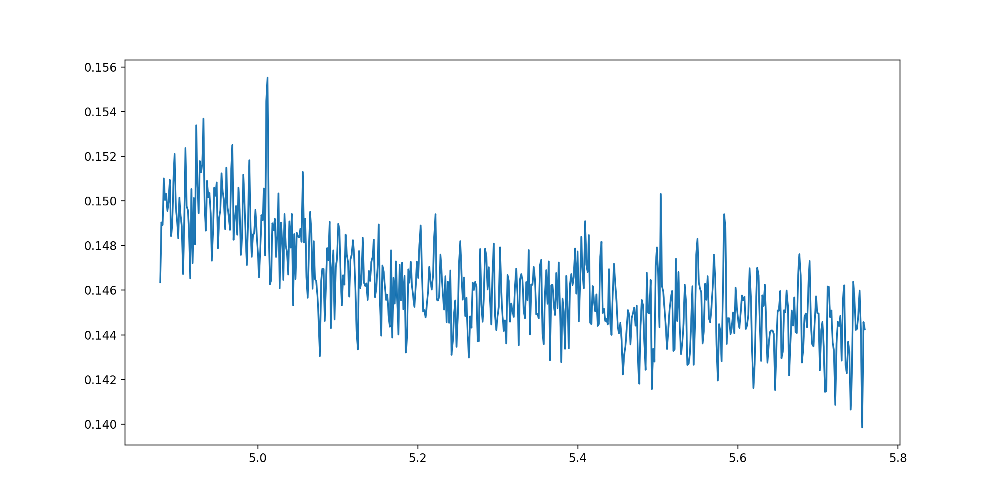

ValueError: operands could not be broadcast together with shapes (552,) (554,) 

In [76]:
plt.figure(figsize=(12,6)) # (36,8)
plt.plot(band_wavelength['1A'],band_alpha_fwhm['1A']/band_wavelength['1A'])
plt.plot(band_wavelength['1B'],band_alpha_fwhm['1B']/band_wavelength['1B'])
plt.plot(band_wavelength['1C'],band_alpha_fwhm['1C']/band_wavelength['1C'])
plt.plot(band_wavelength['2A'],band_alpha_fwhm['2A']/band_wavelength['2A'])
plt.plot(band_wavelength['2B'],band_alpha_fwhm['2B']/band_wavelength['2B'])
plt.plot(band_wavelength['2C'],band_alpha_fwhm['2C']/band_wavelength['2C'])
plt.plot(band_wavelength['3A'],band_alpha_fwhm['3A']/band_wavelength['3A'])
plt.plot(band_wavelength['3B'],band_alpha_fwhm['3B']/band_wavelength['3B'])
plt.plot(band_wavelength['3C'],band_alpha_fwhm['3C']/band_wavelength['3C'])
plt.plot(band_wavelength['4A'],band_alpha_fwhm['4A']/band_wavelength['4A'])
plt.plot(band_wavelength['4B'],band_alpha_fwhm['4B']/band_wavelength['4B'])
plt.plot(band_wavelength['4C'],band_alpha_fwhm['4C']/band_wavelength['4C'])
plt.xlim(4.6,28.2)
# plt.ylim(0,2500)
plt.xlabel('Wavelength [micron]',fontsize=24)
plt.ylabel('Prelim 1D spectrum [DN/sec/micron]',fontsize=24) # mJy/arcsec^2
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

In [ ]:
plt.figure(figsize=(12,6)) # (36,8)
plt.plot(band_wavelength['1A'],band_signal['1A'])
plt.plot(band_wavelength['1B'],band_signal['1B'])
plt.plot(band_wavelength['1C'],band_signal['1C'])
plt.plot(band_wavelength['2A'],band_signal['2A'])
plt.plot(band_wavelength['2B'],band_signal['2B'])
plt.plot(band_wavelength['2C'],band_signal['2C'])
plt.plot(band_wavelength['3A'],band_signal['3A'])
plt.plot(band_wavelength['3B'][band_signal['3B']<3000],band_signal['3B'][band_signal['3B']<3000])
plt.plot(band_wavelength['3C'],band_signal['3C'])
plt.plot(band_wavelength['4A'],band_signal['4A'])
plt.plot(band_wavelength['4B'],band_signal['4B'])
plt.plot(band_wavelength['4C'],band_signal['4C'])
plt.xlim(4.6,28.2)
# plt.ylim(0,2500)
plt.xlabel('Wavelength [micron]',fontsize=24)
plt.ylabel('Prelim 1D spectrum [DN/sec]',fontsize=24) # mJy/arcsec^2
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

<IPython.core.display.Javascript object>


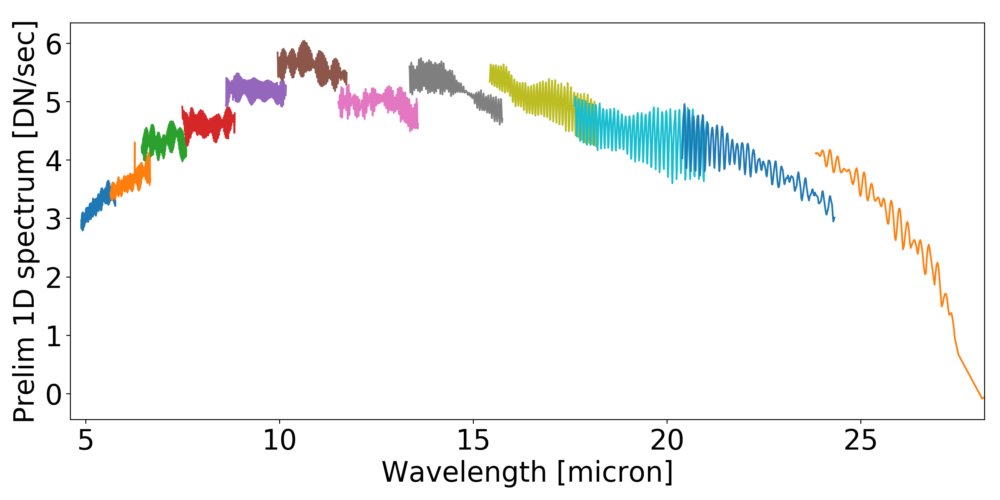

In [21]:
plt.figure(figsize=(12,6)) # (36,8)
plt.plot(band_wavelength['1A'],np.log(band_signal['1A']))
plt.plot(band_wavelength['1B'],np.log(band_signal['1B']))
plt.plot(band_wavelength['1C'],np.log(band_signal['1C']))
plt.plot(band_wavelength['2A'],np.log(band_signal['2A']))
plt.plot(band_wavelength['2B'],np.log(band_signal['2B']))
plt.plot(band_wavelength['2C'],np.log(band_signal['2C']))
plt.plot(band_wavelength['3A'],np.log(band_signal['3A']))
plt.plot(band_wavelength['3B'][band_signal['3B']<3000],np.log(band_signal['3B'][band_signal['3B']<3000]))
plt.plot(band_wavelength['3C'],np.log(band_signal['3C']))
plt.plot(band_wavelength['4A'],np.log(band_signal['4A']))
plt.plot(band_wavelength['4B'],np.log(band_signal['4B']))
plt.plot(band_wavelength['4C'],np.log(band_signal['4C']))
plt.xlim(4.6,28.2)
# plt.ylim(0,2500)
plt.xlabel('Wavelength [micron]',fontsize=24)
plt.ylabel('Prelim 1D spectrum [DN/sec]',fontsize=24) # mJy/arcsec^2
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

In [34]:
print 10000*4/(2*(1509.89-1360.87))
print 10000*1/(2*(1594.72-1540.46))

134.210173131
92.1489126428


In [36]:
freqs_1A, ls_pgram_1A = pergrams.scargle(np.flipud(10000/band_wavelength['1A']),np.flipud(band_signal['1A']), norm='density')
freqs_1B, ls_pgram_1B = pergrams.scargle(np.flipud(10000/band_wavelength['1B']),np.flipud(band_signal['1B']), norm='density')
freqs_1C, ls_pgram_1C = pergrams.scargle(np.flipud(10000/band_wavelength['1C']),np.flipud(band_signal['1C']), norm='density')


<IPython.core.display.Javascript object>


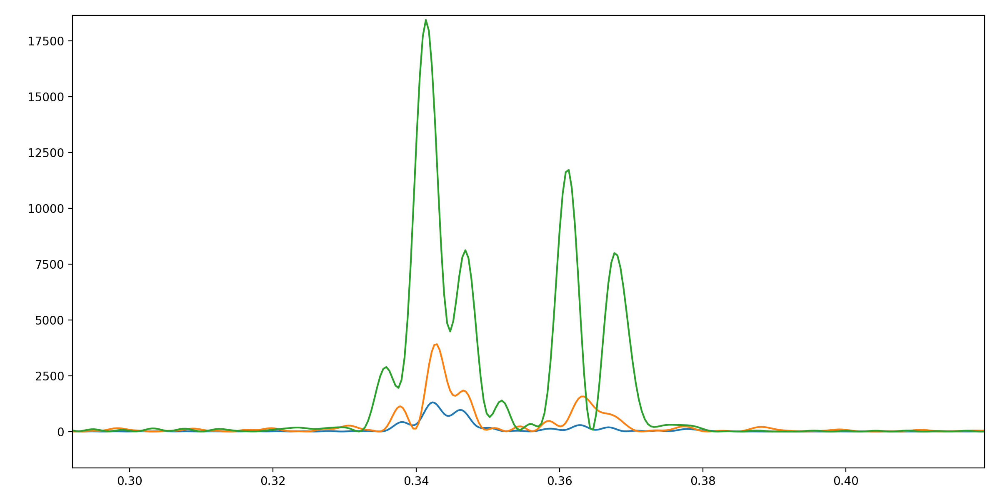

In [37]:
plt.figure(figsize=(12,6))
plt.plot(freqs_1A, ls_pgram_1A)
plt.plot(freqs_1B, ls_pgram_1B)
plt.plot(freqs_1C, ls_pgram_1C)
plt.tight_layout()

<IPython.core.display.Javascript object>


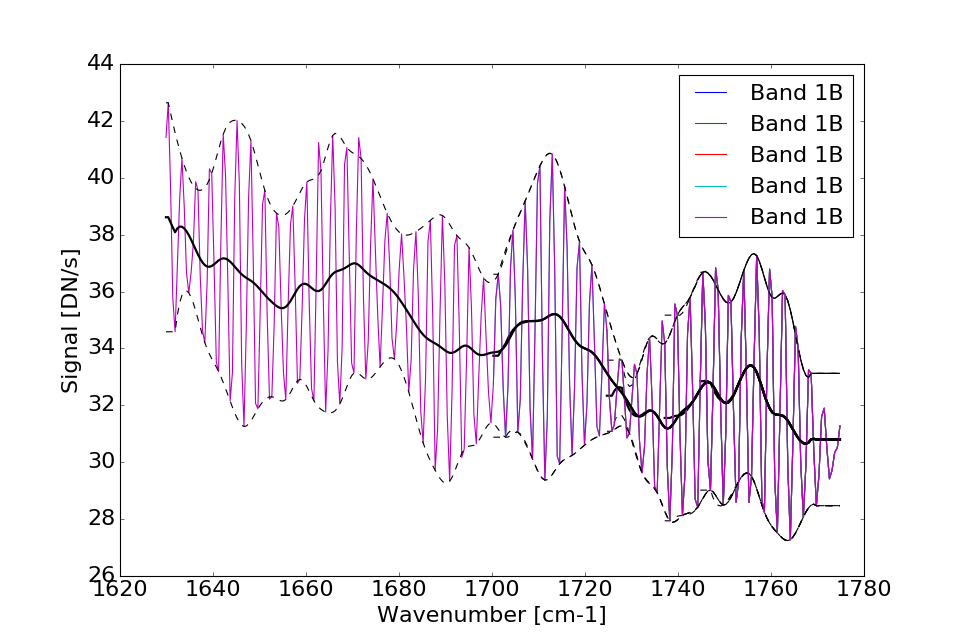

<IPython.core.display.Javascript object>


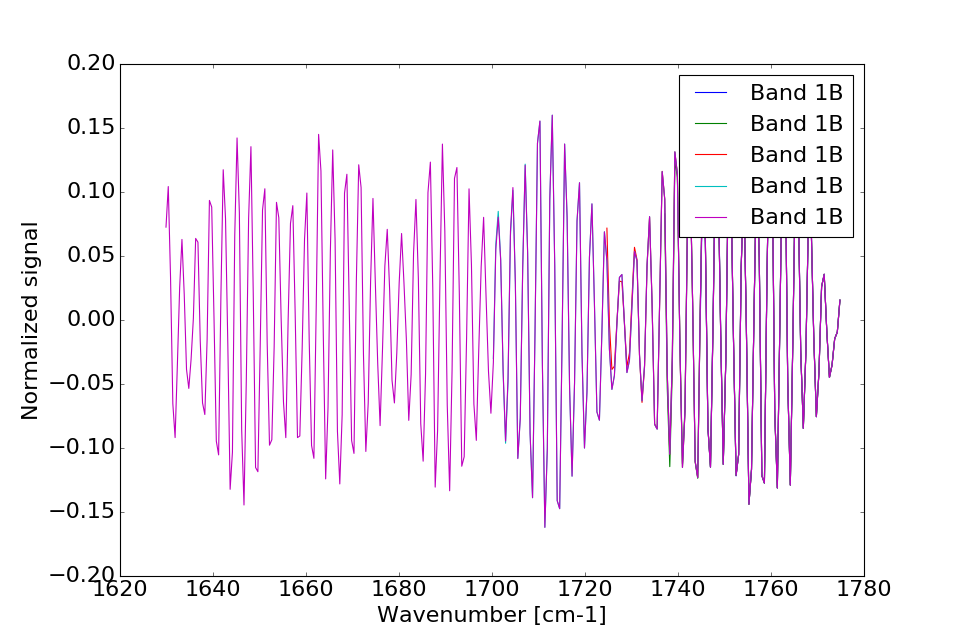

<IPython.core.display.Javascript object>


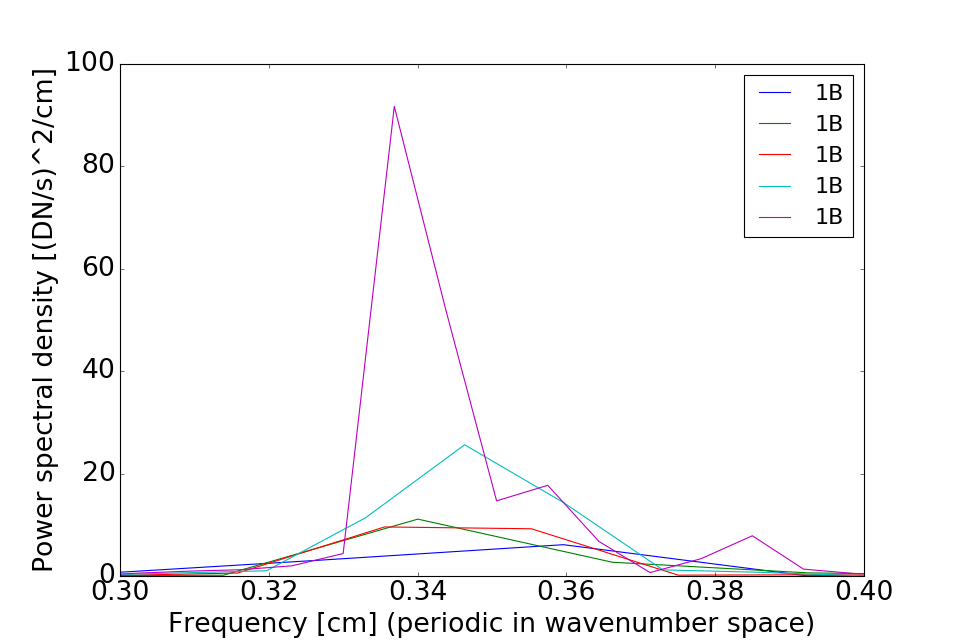

<IPython.core.display.Javascript object>


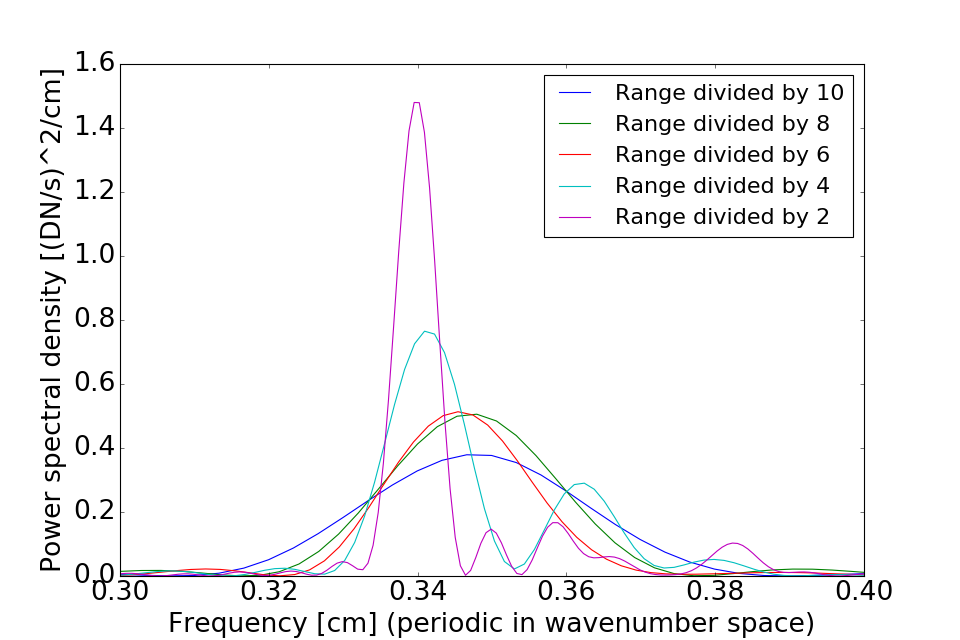

<IPython.core.display.Javascript object>


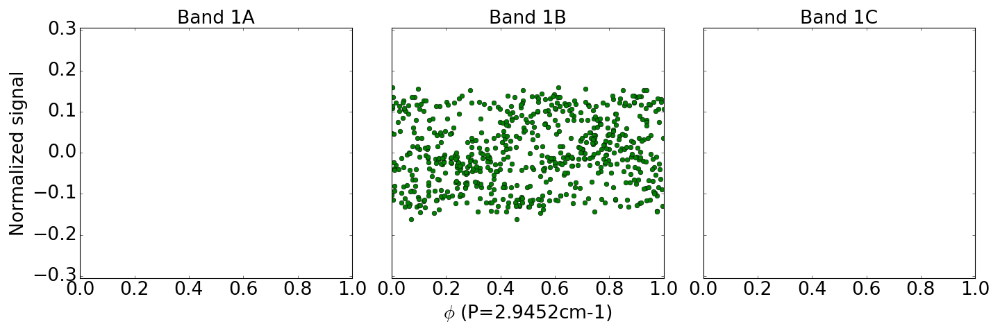

In [43]:
from ivs.timeseries import pergrams

def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / N

fig0,axs0 = plt.subplots(1,1,figsize=(12,8))
fig1,axs1 = plt.subplots(1,1,figsize=(12,8))
fig2,axs2 = plt.subplots(1,1,figsize=(12,8))
fig3,axs3 = plt.subplots(1,1,figsize=(12,8))
fig4,axs4 = plt.subplots(1,3,figsize=(18,6),sharey=True)
for band in ['1B']: # ,'1B','1C'
    for i in [10,8,6,4,2]:
        # start
        wvnr0 = np.flipud(1/(band_wavelength[band][:len(band_wavelength[band])/i]/10000))
        arr0  = np.flipud(band_signal[band][:len(band_signal[band])/i])
    #     # start
    #     wvnr0 = np.flipud(1/(band_wavelength[band]/10000))
    #     arr0  = np.flipud(band_signal[band])

        # normalize
        N = 8
        wvnr = wvnr0[:-N+1]
        arr  = (arr0[:-N+1]-running_mean(arr0,N))/running_mean(arr0,N)

        # determine local minima/maxima
        test_arr1 = arr.copy()
        test_arr1[test_arr1<0] = 0
        peaks1 = find_peaks(test_arr1,thres=0,min_dist=0)
        arr_interpolator1 = scp_interpolate.InterpolatedUnivariateSpline(peaks1,arr0[peaks1],k=3,ext=3)
        arr_profile1 = arr_interpolator1(range(len(arr0)))

        test_arr2 = -arr
        test_arr2[test_arr2<0] = 0
        peaks2 = find_peaks(test_arr2,thres=0,min_dist=0)
        arr_interpolator2 = scp_interpolate.InterpolatedUnivariateSpline(peaks2,arr0[peaks2],k=3,ext=3)
        arr_profile2 = arr_interpolator2(range(len(arr0)))

        runningMean = (arr_profile1+arr_profile2)/2.

        axs0.plot(wvnr0,arr0,label='Band {}'.format(band) )
        if band=='1C':
            axs0.plot(wvnr0,runningMean,'k',linewidth=2,label='running mean')
        axs0.plot(wvnr0,runningMean,'k',linewidth=2)
        axs0.plot(wvnr0,arr_profile1,'k',linestyle='dashed')
        axs0.plot(wvnr0,arr_profile2,'k',linestyle='dashed')

        arr0 = (arr0-runningMean)/runningMean

        # fourier spectrum
        wvnr_equi = np.linspace(wvnr0[0],wvnr0[-1],len(wvnr0))
        arr_equi  = scp_interpolate.interp1d(wvnr0,arr0)(wvnr_equi)

        freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0]) # nyquist frequency
        # start with wavelength varying signal; units are DN/s, values are real
        sp = np.fft.fft(arr_equi) # units are still DN/s, values are complex ( not (DN/s)/Hz - the FFT of the signal should be a point, not an dirac delta function zooming off to infinity with the x-axis) 
        power = np.sqrt(sp.real**2 + sp.imag**2) # absolute value of complex values, termed "modulus", units are still DN/s, values are real - magnitude of signal components
        esd = power**2 # energy spectral density (ESD), units are now (DN/s)^2, values are real - square of magnitudes of signal components
        psd = (1./len(wvnr_equi)) * esd * (wvnr_equi[-1]-wvnr_equi[0])
        freqs, ls_pgram = pergrams.scargle(wvnr0, arr0, norm='density')
        width = 1/freqs[freqs>0.1][ls_pgram[freqs>0.1].argmax()]


        period = width.copy()              # period (must be known already!)

        foldTimes = wvnr0 / period   # divide by period to convert to phase
        foldTimes = foldTimes % 1

        # binning the data
        nbins = 50                  # chosen number of bins across the period
        bin_width = 1.0/float(nbins) # calculate the width of the bins

        # create arrays for bin values and weights
        bins = np.zeros(nbins)
        weights = np.zeros(nbins)

        # bin!
        for j in range(len(arr0)):
            n = int(foldTimes[j] / bin_width) # calculate bin number for this value
            weight = 1./np.var(arr0)         # calculate weight == error^-2
            bins[n] += arr0[j] * weight   # add weighted value to bin (value times weight)
            weights[n] += weight          # add weight to bin weights


        bins /= weights     # normalise weighted values using sum of weights

        binErr = np.sqrt(1.0/(weights))    # calculate bin errors from squared weights

        binEdges = np.arange(nbins) * bin_width     # create array of bin edge values for plotting

        axs1.plot(wvnr0,arr0,label='Band {}'.format(band))
        axs2.plot(freq[freq>0],2*psd[freq>0],label=band)
        axs3.plot(freqs, ls_pgram, label='Range divided by {}'.format(i) )
        if band == '1A':
            axs4[0].plot(foldTimes,arr0,'bo',label=band)
            axs4[0].set_xlabel(r'$\phi$ (P={}cm-1)'.format(round(period,4) ),fontsize=24)
        elif band == '1B':
            axs4[1].plot(foldTimes,arr0,'go',label=band)
            axs4[1].set_xlabel(r'$\phi$ (P={}cm-1)'.format(round(period,4) ),fontsize=24)
        elif band == '1C':
            axs4[2].plot(foldTimes,arr0,'ro',label=band)
            axs4[2].set_xlabel(r'$\phi$ (P={}cm-1)'.format(round(period,4) ),fontsize=24)
    #     for i in range(5):
    #         if band == '1A':
    #             if i ==0:
    #                 axs4.plot(foldTimes+i,arr0,'bo',label='1A')
    #             else:
    #                 axs4.plot(foldTimes+i,arr0,'bo')
    #         elif band == '1B':
    #             if i ==0:
    #                 axs4.plot(foldTimes+i,arr0,'ro',label='1B')
    #             else:
    #                 axs4.plot(foldTimes+i,arr0,'ro')
    #         elif band == '1C':
    #             if i ==0:
    #                 axs4.plot(foldTimes+i,arr0,'go',label='1C')
    #             else:
    #                 axs4.plot(foldTimes+i,arr0,'go')
    #     axs4.plot(binEdges,bins,'r')
    
axs0.set_xlabel('Wavenumber [cm-1]',fontsize=20)
axs0.set_ylabel('Signal [DN/s]',fontsize=20)
axs0.legend(loc='upper right',fontsize=20)
axs0.tick_params(axis='both',labelsize=20)
    
axs1.set_xlabel('Wavenumber [cm-1]',fontsize=20)
axs1.set_ylabel('Normalized signal',fontsize=20)
axs1.legend(loc='upper right',fontsize=20)
axs1.tick_params(axis='both',labelsize=20)
# plt.tight_layout()
    
axs2.set_xlabel('Frequency [cm] (periodic in wavenumber space)',fontsize=24)
axs2.set_ylabel('Power spectral density [(DN/s)^2/cm]',fontsize=24)
axs2.set_xlim(0.3,0.4)
axs2.tick_params(axis='both',labelsize=24)
axs2.legend(loc='upper right',fontsize=20)
# plt.tight_layout()
# plt.grid()

axs3.set_xlabel('Frequency [cm] (periodic in wavenumber space)',fontsize=24)
axs3.set_ylabel('Power spectral density [(DN/s)^2/cm]',fontsize=24)
axs3.set_xlim(0.3,0.4)
axs3.tick_params(axis='both',labelsize=24)
axs3.legend(loc='upper right',fontsize=20)
# plt.tight_layout()
# plt.grid()

axs4[0].set_ylabel('Normalized signal',fontsize=24)
axs4[0].set_ylim(-0.305,0.305)
axs4[0].set_title('Band 1A',fontsize=24)
axs4[1].set_title('Band 1B',fontsize=24)
axs4[2].set_title('Band 1C',fontsize=24)
axs4[0].tick_params(axis='both',labelsize=24)
axs4[1].tick_params(axis='both',labelsize=24)
axs4[2].tick_params(axis='both',labelsize=24)
# axs4.legend(loc='upper right',fontsize=20)
plt.tight_layout()


<IPython.core.display.Javascript object>


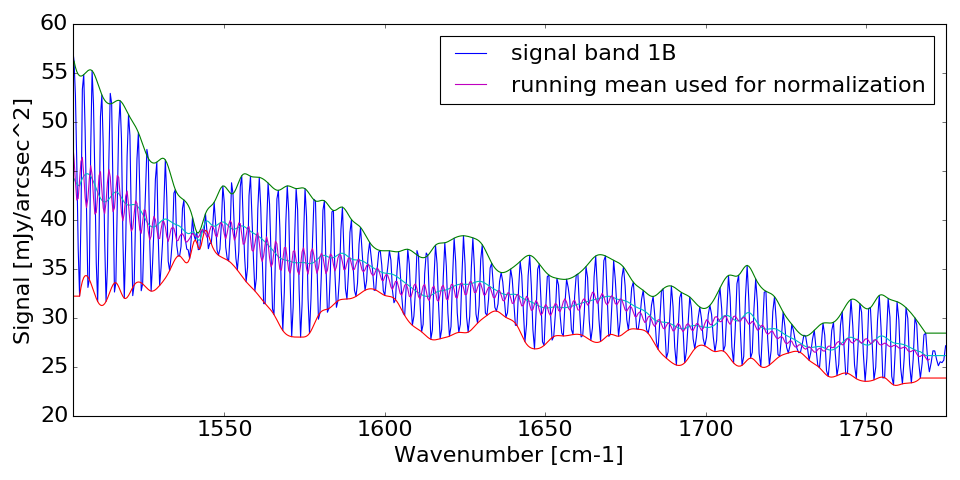

<IPython.core.display.Javascript object>


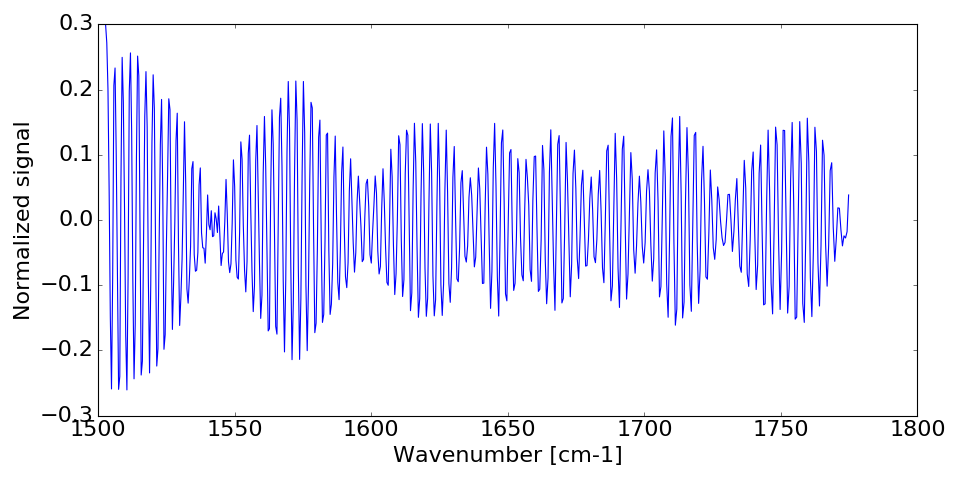

<IPython.core.display.Javascript object>


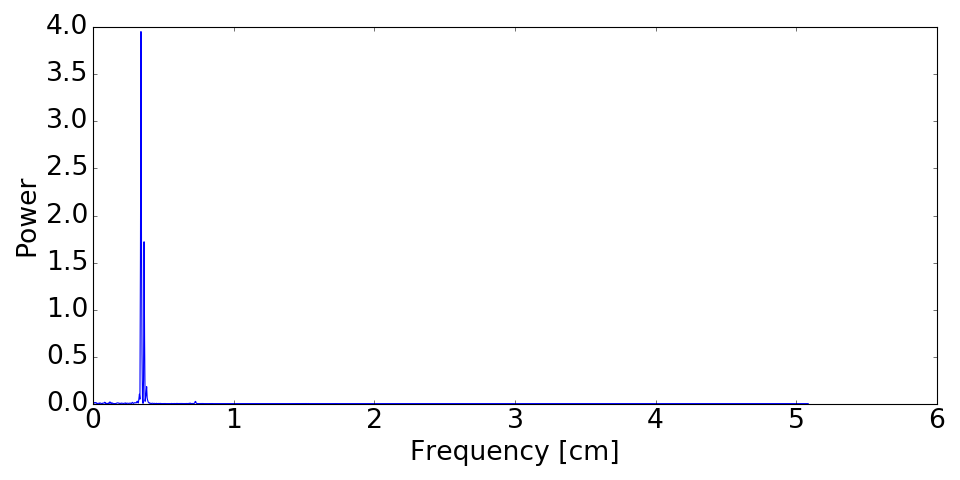

<IPython.core.display.Javascript object>


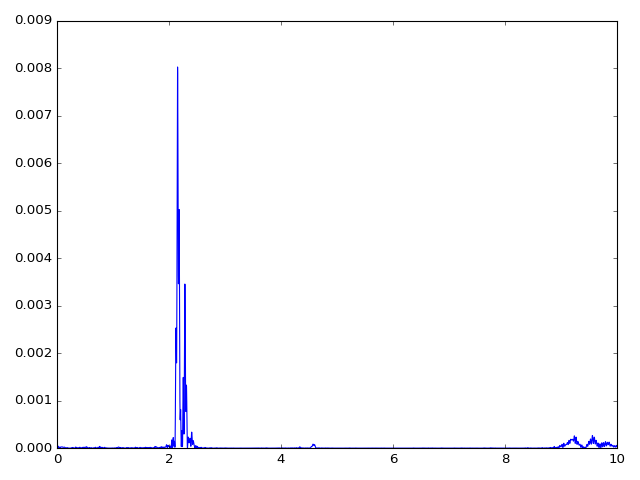

In [83]:
band = '1B'
# start
wvnr0 = np.flipud(1/(band_wavelength[band]/10000))
arr0  = np.flipud(band_signal[band])

# normalize
N = 10
wvnr = wvnr0[:-N+1]
arr  = (arr0[:-N+1]-running_mean(arr0,N))/running_mean(arr0,N)

# determine local minima/maxima
test_arr1 = arr.copy()
test_arr1[test_arr1<0] = 0
peaks1 = find_peaks(test_arr1,thres=0,min_dist=0)
arr_interpolator1 = scp_interpolate.InterpolatedUnivariateSpline(peaks1,arr0[peaks1],k=3,ext=3)
arr_profile1 = arr_interpolator1(range(len(arr0)))

test_arr2 = -arr
test_arr2[test_arr2<0] = 0
peaks2 = find_peaks(test_arr2,thres=0,min_dist=0)
arr_interpolator2 = scp_interpolate.InterpolatedUnivariateSpline(peaks2,arr0[peaks2],k=3,ext=3)
arr_profile2 = arr_interpolator2(range(len(arr0)))

plt.figure(figsize=(12,6))
plt.plot(wvnr0,arr0,label='signal band {}'.format(band))
plt.plot(wvnr0,arr_profile1,wvnr0,arr_profile2)
plt.plot(wvnr0,(arr_profile1+arr_profile2)/2.)
plt.plot(wvnr0[:-N+1],running_mean(arr0,N),label='running mean used for normalization')
plt.xlim(wvnr0[0],wvnr0[-1])
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [mJy/arcsec^2]',fontsize=20)
plt.legend(loc='upper right',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

runningMean = (arr_profile1+arr_profile2)/2.

plt.figure(figsize=(12,6))
plt.plot(wvnr0,(arr0-runningMean)/runningMean)
# plt.xlim(1730,2050)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

arr0 = (arr0-runningMean)/runningMean

# fourier spectrum
wvnr_equi = np.linspace(wvnr0[0],wvnr0[-1],5*len(wvnr0))
arr_equi  = scp_interpolate.interp1d(wvnr0,arr0)(wvnr_equi)

freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0]) # nyquist sampling
# start with wavelength varying signal; units are DN/s, values are real
sp = np.fft.fft(arr_equi) # units are still DN/s, values are complex ( not (DN/s)/Hz - the FFT of the signal should be a point, not an dirac delta function zooming off to infinity with the x-axis) 
power = np.sqrt(sp.real**2 + sp.imag**2) # absolute value of complex values, termed "modulus", units are still DN/s, values are real - magnitude of signal components
esd = power**2 # energy spectral density (ESD), units are now (DN/s)^2, values are real - square of magnitudes of signal components
psd = esd/arr_equi.shape[0]

plt.figure(figsize=(12,6))
plt.plot(freq[freq>0],psd[freq>0])
plt.xlabel('Frequency [cm]',fontsize=24)
plt.ylabel('Power',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

# width = 1/freq[freq>0.1][power[freq>0.1].argmax()]

# plt.figure(figsize=(12,6))
# testx,testy = [],[]
# i=0
# while (i+1)*width<wvnr[-1]:
#     idx1 = find_nearest(wvnr0,i*width)
#     idx2 = find_nearest(wvnr0,(i+1)*width)
#     plt.plot(np.arange(len(arr0[idx1:idx2])),arr0[idx1:idx2]+i*0.05,'b')
#     testx.extend(arr0[idx1:idx2])
#     i+=1
# plt.xlim(0,width)
# plt.tick_params(axis='both',labelsize=20)
# plt.tight_layout()

# # phase-folding "light-curve"
# period = width.copy()              # period (must be known already!)

# foldTimes = wvnr0 / period   # divide by period to convert to phase
# foldTimes = foldTimes % 1   # take fractional part of phase only (i.e. discard whole number part)

# plt.figure(figsize=(12,6))
# plt.plot(foldTimes,arr0,'bo')
# plt.tight_layout()

# # binning the data
# nbins = 50                  # chosen number of bins across the period
# width = 1.0/float(nbins) # calculate the width of the bins

# # create arrays for bin values and weights
# bins = np.zeros(nbins)
# weights = np.zeros(nbins)

# # bin!
# for i in range(len(arr0)):
#     n = int(foldTimes[i] / width) # calculate bin number for this value
#     weight = 1.         # calculate weight == error^-2
#     bins[n] += arr0[i] * weight   # add weighted value to bin (value times weight)
#     weights[n] += weight          # add weight to bin weights


# bins /= weights     # normalise weighted values using sum of weights

# binErr = np.sqrt(1.0/(weights))    # calculate bin errors from squared weights

# binEdges = np.arange(nbins) * width     # create array of bin edge values for plotting

# plt.figure()
# plt.errorbar(binEdges,bins,yerr=binErr,linestyle='none',marker='o')  # plot binned lightcurve
# plt.tight_layout()

f = np.linspace(0.001,10,5000)
pgram = lombscargle(wvnr0,arr0,f)
normval = wvnr0.shape[0]

plt.figure()
plt.plot(f,np.sqrt(4*(pgram/normval)))
plt.tight_layout()

<IPython.core.display.Javascript object>


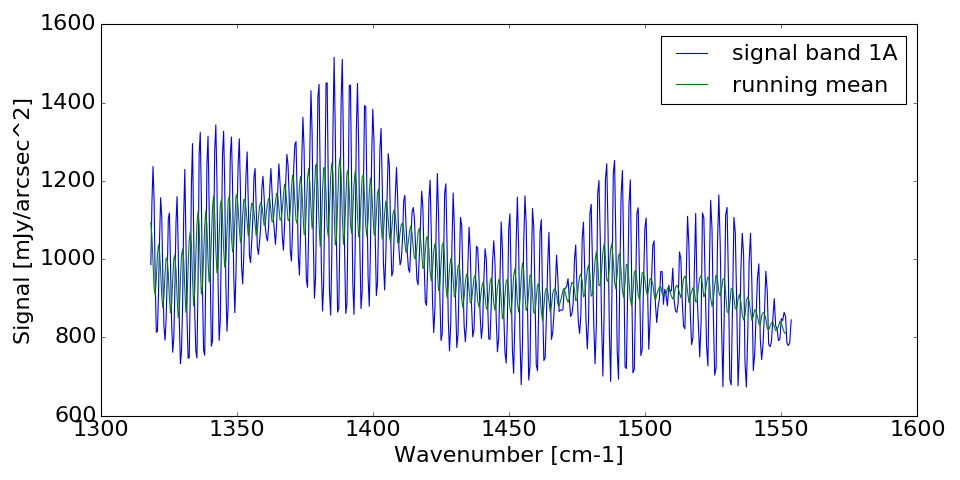

<IPython.core.display.Javascript object>


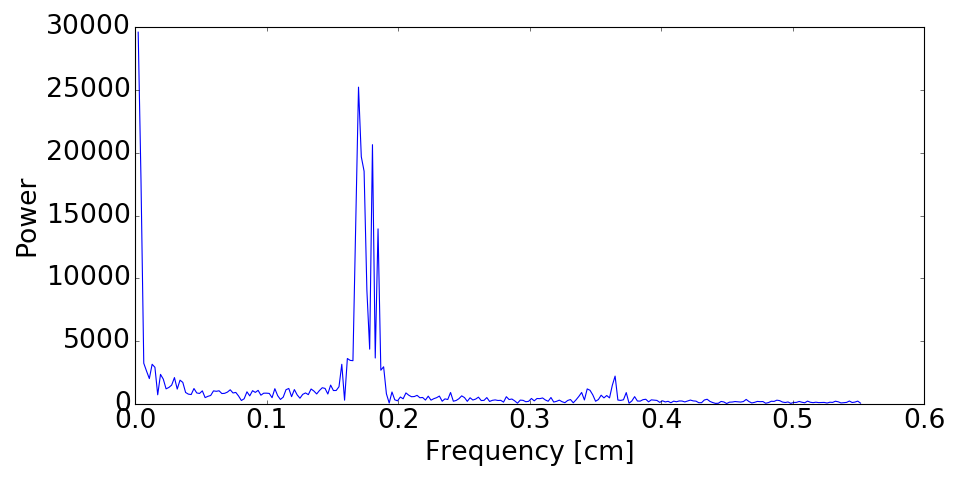

<IPython.core.display.Javascript object>


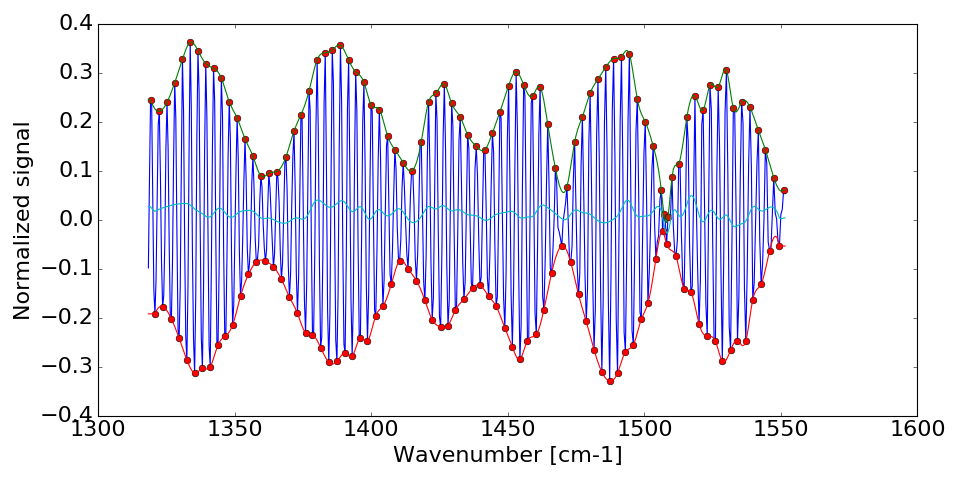

<IPython.core.display.Javascript object>


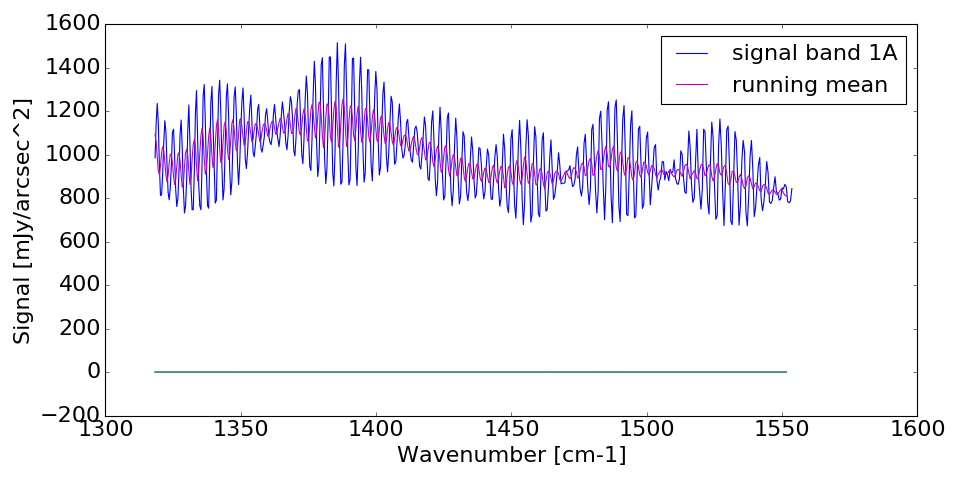

<IPython.core.display.Javascript object>


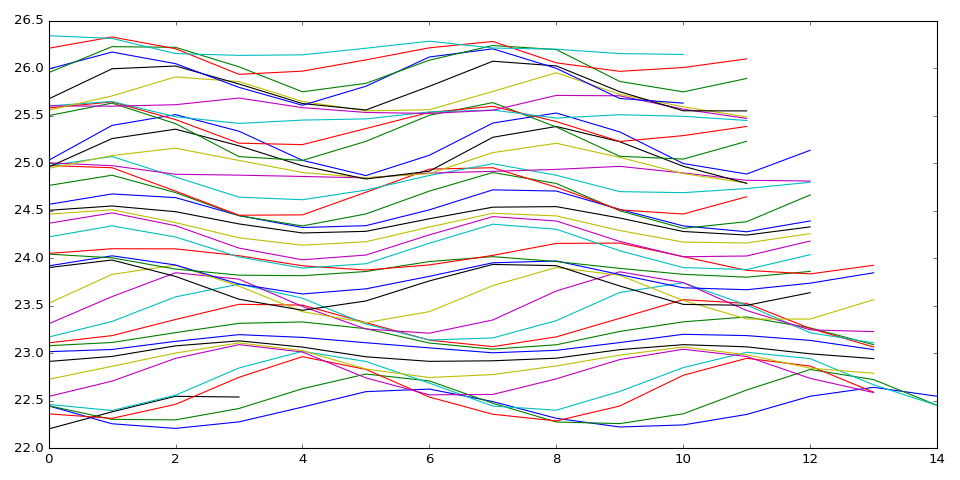

In [124]:
def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / N

wvnr0 = np.flipud(1/(band_wavelength['1C']/10000))
arr0  = np.flipud(band_signal['1C'])

test_arr1 = arr.copy()
test_arr1[test_arr1<0] = 0
peaks1 = find_peaks(test_arr1,thres=0,min_dist=0)
arr_interpolator1 = scp_interpolate.InterpolatedUnivariateSpline(peaks1,arr0[peaks1],k=3,ext=3)
arr_profile1 = arr_interpolator1(range(len(arr)))

test_arr2 = -arr
test_arr2[test_arr2<0] = 0
peaks2 = find_peaks(test_arr2,thres=0,min_dist=0)
arr_interpolator2 = scp_interpolate.InterpolatedUnivariateSpline(peaks2,arr0[peaks2],k=3,ext=3)
arr_profile2 = arr_interpolator2(range(len(arr)))

N = 5
plt.figure(figsize=(12,6))
plt.plot(wvnr0,arr0,label='signal band 1A')
plt.plot(wvnr,arr_profile1,wvnr,arr_profile2)
plt.plot(wvnr,(arr_profile1+arr_profile2)/2.)
plt.plot(wvnr0[:-N+1],running_mean(arr0,N),label='running mean')
# plt.xlim(1730,2050)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Signal [mJy/arcsec^2]',fontsize=20)
plt.legend(loc='upper right',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

# fourier spectrum
wvnr_equi = np.linspace(wvnr0[0],wvnr0[-1],len(wvnr0))
arr_equi  = scp_interpolate.interp1d(wvnr0,arr0)(wvnr_equi)

freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0])/2. # nyquist frequency
sp = np.fft.fft(arr_equi)
power = np.sqrt(sp.real**2 + sp.imag**2)

width = 1/freq[freq>0.1][power[freq>0.1].argmax()]

plt.figure(figsize=(12,6))
plt.plot(freq[freq>0],power[freq>0])
plt.xlabel('Frequency [cm]',fontsize=24)
plt.ylabel('Power',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

wvnr = wvnr0[:-N+1]
arr  =  (arr0[:-N+1]-running_mean(arr0,N))/running_mean(arr0,N)

test_arr1 = arr.copy()
test_arr1[test_arr1<0] = 0
peaks1 = find_peaks(test_arr1,thres=0,min_dist=0)
arr_interpolator1 = scp_interpolate.InterpolatedUnivariateSpline(peaks1,arr[peaks1],k=3,ext=3)
arr_profile1 = arr_interpolator1(range(len(arr)))

test_arr2 = -arr
test_arr2[test_arr2<0] = 0
peaks2 = find_peaks(test_arr2,thres=0,min_dist=0)
arr_interpolator2 = scp_interpolate.InterpolatedUnivariateSpline(peaks2,arr[peaks2],k=3,ext=3)
arr_profile2 = arr_interpolator2(range(len(arr)))

plt.figure(figsize=(12,6))
plt.plot(wvnr,arr)
plt.plot(wvnr[peaks1],arr[peaks1],'ro')
plt.plot(wvnr[peaks2],arr[peaks2],'ro')
plt.plot(wvnr,arr_profile1,wvnr,arr_profile2)
plt.plot(wvnr,(arr_profile1+arr_profile2)/2.)
# plt.xlim(1730,2050)
plt.xlabel('Wavenumber [cm-1]',fontsize=20)
plt.ylabel('Normalized signal',fontsize=20)
plt.legend(loc='upper right',fontsize=20)
plt.tick_params(axis='both',labelsize=20)
plt.tight_layout()

plt.figure(figsize=(12,6))
i=0
while (i+1)*width<wvnr[-1]:
    idx1 = find_nearest(wvnr,i*width)
    idx2 = find_nearest(wvnr,(i+1)*width)
    plt.plot(np.arange(len(arr[idx1:idx2])),arr[idx1:idx2]+i*0.1)
    i+=1
plt.tight_layout()



<IPython.core.display.Javascript object>


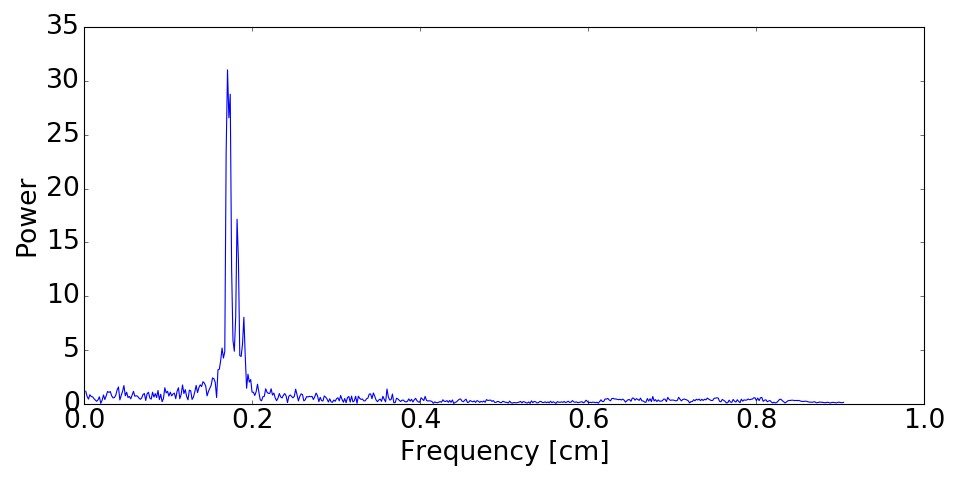

In [76]:
# fourier spectrum
wvnr_equi = np.linspace(wvnr[0],wvnr[-1],2*len(wvnr))
arr_equi  = scp_interpolate.interp1d(wvnr,arr)(wvnr_equi)

freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0])/2. # nyquist frequency
sp = np.fft.fft(arr_equi)
power = np.sqrt(sp.real**2 + sp.imag**2)

plt.figure(figsize=(12,6))
plt.plot(freq[freq>0],power[freq>0])
plt.xlabel('Frequency [cm]',fontsize=24)
plt.ylabel('Power',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

<IPython.core.display.Javascript object>


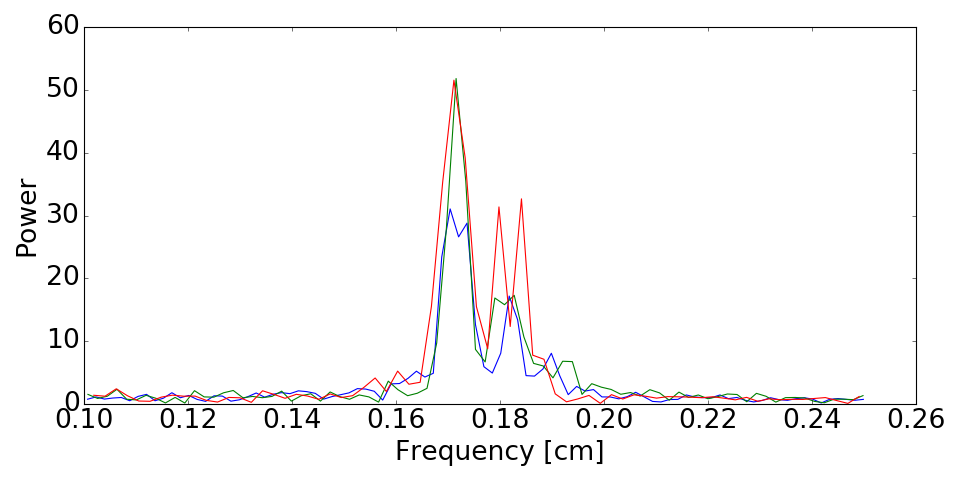

In [81]:
plt.figure(figsize=(12,6))
for band in ['1A','1B','1C']:
    wvnr = np.flipud(1/(band_wavelength[band]/10000))
    arr  = np.flipud(band_signal[band])

    N = 10
    wvnr = wvnr[:-N+1]
    arr  =  (arr[:-N+1]-running_mean(arr,N))/running_mean(arr,N)
    
    # fourier spectrum
    wvnr_equi = np.linspace(wvnr[0],wvnr[-1],2*len(wvnr))
    arr_equi  = scp_interpolate.interp1d(wvnr,arr)(wvnr_equi)

    freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0])/2. # nyquist frequency
    sp = np.fft.fft(arr_equi)
    power = np.sqrt(sp.real**2 + sp.imag**2)

    sel = (freq>=0.1) & (freq<=0.25)
    plt.plot(freq[sel],power[sel])
plt.xlabel('Frequency [cm]',fontsize=24)
plt.ylabel('Power',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

In [107]:
band_wavelengths = np.concatenate((\
                    band_wavelength['1A'],\
                    band_wavelength['1B'][band_wavelength['1B']>band_wavelength['1A'][-1]],\
                    band_wavelength['1C'][band_wavelength['1C']>band_wavelength['1B'][-1]],\
                    band_wavelength['2A'][band_wavelength['2A']>band_wavelength['1C'][-1]],\
                    band_wavelength['2B'][band_wavelength['2B']>band_wavelength['2A'][-1]],\
                    band_wavelength['2C'][band_wavelength['2C']>band_wavelength['2B'][-1]],\
                    band_wavelength['3A'][band_wavelength['3A']>band_wavelength['2C'][-1]],\
                    band_wavelength['3B'][band_wavelength['3B']>band_wavelength['3A'][-1]],\
                    band_wavelength['3C'][band_wavelength['3C']>band_wavelength['3B'][-1]],\
                    band_wavelength['4A'][band_wavelength['4A']>band_wavelength['3C'][-1]],\
                    band_wavelength['4B'][band_wavelength['4B']>band_wavelength['4A'][-1]],\
                    band_wavelength['4C'][band_wavelength['4C']>band_wavelength['4B'][-1]]
                                 ))

band_signals = np.concatenate((\
                    band_signal['1A'],\
                    band_signal['1B'][band_wavelength['1B']>band_wavelength['1A'][-1]],\
                    band_signal['1C'][band_wavelength['1C']>band_wavelength['1B'][-1]],\
                    band_signal['2A'][band_wavelength['2A']>band_wavelength['1C'][-1]],\
                    band_signal['2B'][band_wavelength['2B']>band_wavelength['2A'][-1]],\
                    band_signal['2C'][band_wavelength['2C']>band_wavelength['2B'][-1]],\
                    band_signal['3A'][band_wavelength['3A']>band_wavelength['2C'][-1]],\
                    band_signal['3B'][band_wavelength['3B']>band_wavelength['3A'][-1]],\
                    band_signal['3C'][band_wavelength['3C']>band_wavelength['3B'][-1]],\
                    band_signal['4A'][band_wavelength['4A']>band_wavelength['3C'][-1]],\
                    band_signal['4B'][band_wavelength['4B']>band_wavelength['4A'][-1]],\
                    band_signal['4C'][band_wavelength['4C']>band_wavelength['4B'][-1]]
                                 ))

<IPython.core.display.Javascript object>


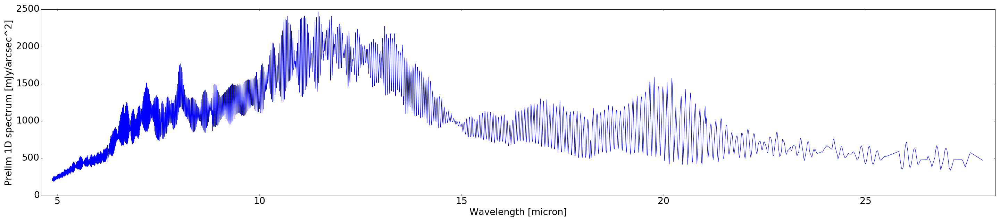

In [117]:
plt.figure(figsize=(36,8))
plt.plot(band_wavelengths[band_signals<3000.],band_signals[band_signals<3000.])
plt.xlim(4.6,28.2)
plt.ylim(0)
plt.xlabel('Wavelength [micron]',fontsize=24)
plt.ylabel('Prelim 1D spectrum [mJy/arcsec^2]',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

<IPython.core.display.Javascript object>


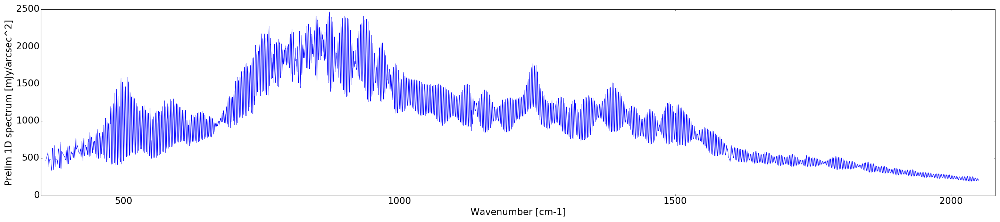

In [125]:
wvnr = np.flipud(1/(band_wavelengths[band_signals<3000.]/10000))
arr  = np.flipud(band_signals[band_signals<3000.])

plt.figure(figsize=(36,8))
plt.plot(wvnr,arr)
plt.xlim(350,2080)
plt.xlabel('Wavenumber [cm-1]',fontsize=24)
plt.ylabel('Prelim 1D spectrum [mJy/arcsec^2]',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

<IPython.core.display.Javascript object>


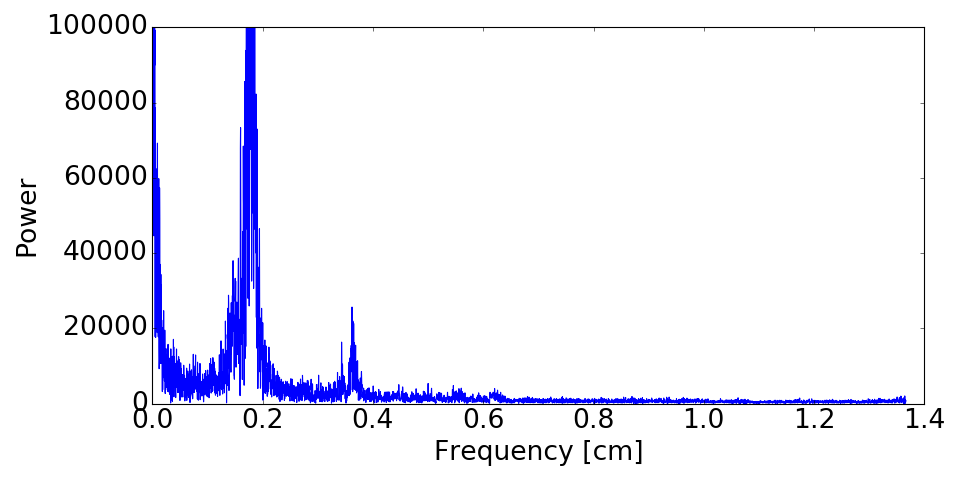

In [133]:
# fourier spectrum
wvnr = np.flipud(1/(band_wavelengths[band_signals<3000.]/10000))
arr  = np.flipud(band_signals[band_signals<3000.])

wvnr_equi = np.linspace(wvnr[0],wvnr[-1],2*len(wvnr))
arr_equi  = scp_interpolate.interp1d(wvnr,arr)(wvnr_equi)

freq = np.fft.fftfreq(wvnr_equi.shape[-1],d=np.diff(wvnr_equi)[0])/2. # nyquist frequency
sp = np.fft.fft(arr_equi)
power = np.sqrt(sp.real**2 + sp.imag**2)

plt.figure(figsize=(12,6))
plt.plot(freq[freq>0],power[freq>0])
plt.ylim(0,1e5)
plt.xlabel('Frequency [cm]',fontsize=24)
plt.ylabel('Power',fontsize=24)
plt.tick_params(axis='both',labelsize=24)
plt.tight_layout()

In [137]:
from scipy.signal import lombscargle

<IPython.core.display.Javascript object>


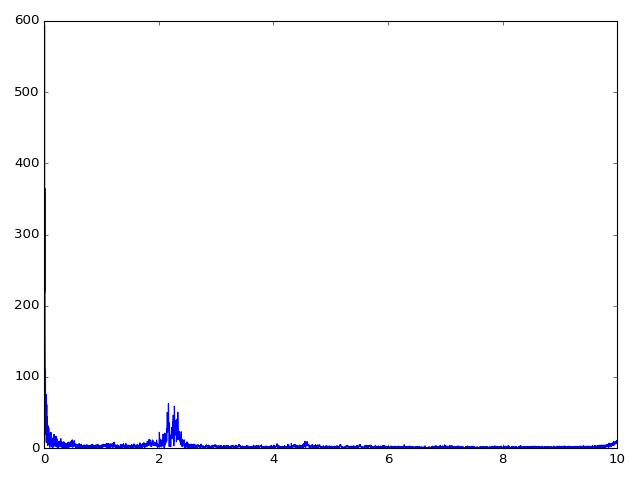

In [140]:
f = np.linspace(0.001,10,10000)
pgram = lombscargle(wvnr,arr-np.mean(arr),f)
normval = wvnr.shape[0]

plt.figure()
plt.plot(f,np.sqrt(4*(pgram/normval)))
plt.tight_layout()